# Project: Wrangling and Analyze Data

## Data Gathering
Gathering all three pieces of data for this project and loading them in the notebook.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [1]:
1# importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import re
import os
from functools import reduce
from io import StringIO
import json
%matplotlib inline
sns.set_style('darkgrid')
sns.set_palette('Set2')

In [2]:
# loading the twitter archive csv file into a dataframe
df_archive = pd.read_csv('twitter-archive-enhanced.csv')

In [3]:
df_archive.shape

(2356, 17)

In [4]:
df_archive.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [5]:
df_archive.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [6]:
# create a variable with the url
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'

In [7]:
# pass the url to query
response = requests.get(url)

In [8]:
# check response status
response

<Response [200]>

In [9]:
# convert response to string encoded utf-8
result = str(response.content, 'UTF-8')
data = StringIO(result)

In [10]:
# load tsv data to dataframe
df_pred = pd.read_csv(data, sep = '\t')

In [11]:
df_pred.shape

(2075, 12)

In [12]:
df_pred.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [13]:
df_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. To Use the Tweepy library to query additional data via the Twitter API; twitter did not approve my reguest for api keys and authentication, download the data from the tweet-json text url.

In [14]:
# Make a directory to download
# tweet_json.txt into
folder_name = 'json_folder'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

In [15]:
# query the url to json-text file
url_json = 'https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt'
response = requests.get(url_json)

In [16]:
# check response status
response

<Response [200]>

In [17]:
# write the json text file in the directory created above
with open(os.path.join('json_folder', url_json.split('/')[-1]), mode = 'wb') as file:
    file.write(response.content)

In [18]:
# asssign the tweet_id to dataframe1 tewwt_id
tweet_ids = list(df_archive['tweet_id'])

In [19]:
# Load json data from the directory
# append the data to empty list
json_data = []
with open (r'C:\Users\AYOTUNDE DOHERTY\Documents\Udacity_DAND\Project2\json_folder\tweet-json.txt') as json_file:
    for line in json_file:
        json_data.append(json.loads(line))

In [20]:
# create an empty list to hold he tweets 
# append the extracted tweets to the list
tweet_list = []
for i in range(len(json_data)):
    tweet_id = json_data[i]['id']
    favorite_count = json_data[i]['favorite_count']
    retweet_count = json_data[i]['retweet_count']
    tweet_list.append({'tweet_id': tweet_id,
                       'favorite_count': favorite_count,
                       'retweet_count': retweet_count })

In [21]:
# convert list to dataframe
df_json = pd.DataFrame(tweet_list, columns=['tweet_id', 'favorite_count', 'retweet_count'])
df_json.head()

,tweet_id,favorite_count,retweet_count
0,892420643555336193,39467,8853
1,892177421306343426,33819,6514
2,891815181378084864,25461,4328
3,891689557279858688,42908,8964
4,891327558926688256,41048,9774


In [22]:
df_json.shape

(2354, 3)

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



In [23]:
# checking info on df_archive
df_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [24]:
# access random row in text column
df_archive.text[10]

'This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic. 13/10 would risk a petting #BarkWeek https://t.co/dVPW0B0Mme'

In [25]:
# access the same random row in name column
df_archive.name[10]

'Koda'

In [26]:
# value count of source of tweet column
df_archive.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [27]:
# access sum of null values in
# expanded_urls column
sum_of_null_expanded_url = df_archive.expanded_urls.isnull().sum()
print('The sum of null values in expanded_urls column amount to {}'.format(sum_of_null_expanded_url))

The sum of null values in expanded_urls column amount to 59


In [28]:
# function to access % of null values in
# each column and give a comment
def percent_of_null_values(column, text):
    """"check mean of null values and multiply with 100""
    ""'"param: column, text"""
    """"returns comment, percent"""
    percent = column.isnull().mean() * 100
    comment = text
    return comment, percent  

In [29]:
# call func to check % of null values
# in expanded_urls column
percent_of_null_values(df_archive.expanded_urls, 'Percentage of null values in expanded_urls column stands at')

('Percentage of null values in expanded_urls column stands at',
 2.504244482173175)

In [30]:
# call func to check % of null values
# in in_reply_to_status column
percent_of_null_values(df_archive.in_reply_to_status_id, 'Percentage of null values in in_reply_to_status column stands at')

('Percentage of null values in in_reply_to_status column stands at',
 96.68930390492359)

In [31]:
# call func to check % of null values
# in in_reply_to_user_id column
percent_of_null_values(df_archive.in_reply_to_user_id, 'Percentage of null values in in_reply_to_user_id column stands at')

('Percentage of null values in in_reply_to_user_id column stands at',
 96.68930390492359)

In [32]:
# call func to check % of null values
# in retweeted_status_id column
percent_of_null_values(df_archive.retweeted_status_id, 'Percentage of null values in retweeted_status_id column stands at')

('Percentage of null values in retweeted_status_id column stands at',
 92.31748726655347)

In [33]:
# call func to check % of null values
# in retweeted_status_user_id column
percent_of_null_values(df_archive.retweeted_status_user_id, 'Percentage of null values in retweeted_status_user_id column stands at')

('Percentage of null values in retweeted_status_user_id column stands at',
 92.31748726655347)

In [34]:
# call func to check % of null values
# in retweeted_status_timestamp column
percent_of_null_values(df_archive.retweeted_status_timestamp, 'Percentage of null values in retweeted_status_timestamp column stands at')

('Percentage of null values in retweeted_status_timestamp column stands at',
 92.31748726655347)

In [35]:
# access number of ids that retweeted
df_archive.retweeted_status_user_id.nunique()

25

In [36]:
# access the retweets
df_archive[df_archive['retweeted_status_user_id'].notnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
19,888202515573088257,NaN,NaN,2017-07-21 01:02:36 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Canela. She attempted s...,8.874740e+17,4.196984e+09,2017-07-19 00:47:34 +0000,https://twitter.com/dog_rates/status/887473957...,13,10,Canela,None,None,None,None
32,886054160059072513,NaN,NaN,2017-07-15 02:45:48 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @Athletics: 12/10 #BATP https://t.co/WxwJmv...,8.860537e+17,1.960740e+07,2017-07-15 02:44:07 +0000,https://twitter.com/dog_rates/status/886053434...,12,10,None,None,None,None,None
36,885311592912609280,NaN,NaN,2017-07-13 01:35:06 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Lilly. She just paralle...,8.305833e+17,4.196984e+09,2017-02-12 01:04:29 +0000,https://twitter.com/dog_rates/status/830583320...,13,10,Lilly,None,None,None,None
68,879130579576475649,NaN,NaN,2017-06-26 00:13:58 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Emmy. She was adopted t...,8.780576e+17,4.196984e+09,2017-06-23 01:10:23 +0000,https://twitter.com/dog_rates/status/878057613...,14,10,Emmy,None,None,None,None
73,878404777348136964,NaN,NaN,2017-06-24 00:09:53 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Shadow. In an attempt to r...,8.782815e+17,4.196984e+09,2017-06-23 16:00:04 +0000,"https://www.gofundme.com/3yd6y1c,https://twitt...",13,10,Shadow,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1023,746521445350707200,NaN,NaN,2016-06-25 01:52:36 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Shaggy. He knows exactl...,6.678667e+17,4.196984e+09,2015-11-21 00:46:50 +0000,https://twitter.com/dog_rates/status/667866724...,10,10,Shaggy,None,None,None,None
1043,743835915802583040,NaN,NaN,2016-06-17 16:01:16 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Extremely intelligent dog here....,6.671383e+17,4.196984e+09,2015-11-19 00:32:12 +0000,https://twitter.com/dog_rates/status/667138269...,10,10,None,None,None,None,None
1242,711998809858043904,NaN,NaN,2016-03-21 19:31:59 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @twitter: @dog_rates Awesome Tweet! 12/10. ...,7.119983e+17,7.832140e+05,2016-03-21 19:29:52 +0000,https://twitter.com/twitter/status/71199827977...,12,10,None,None,None,None,None
2259,667550904950915073,NaN,NaN,2015-11-20 03:51:52 +0000,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",RT @dogratingrating: Exceptional talent. Origi...,6.675487e+17,4.296832e+09,2015-11-20 03:43:06 +0000,https://twitter.com/dogratingrating/status/667...,12,10,None,None,None,None,None


In [37]:
# access the expanded_url column
df_archive.expanded_urls.value_counts()

https://twitter.com/dog_rates/status/700747788515020802/photo/1                                                                                                                                    2
https://www.gofundme.com/3yd6y1c,https://twitter.com/dog_rates/status/878281511006478336/photo/1                                                                                                   2
https://twitter.com/dog_rates/status/819227688460238848/photo/1                                                                                                                                    2
https://twitter.com/dog_rates/status/759923798737051648/photo/1                                                                                                                                    2
https://twitter.com/dog_rates/status/786233965241827333/photo/1                                                                                                                                    2
               

In [38]:
# access the rows of dog 
# without a given name 
no_name_df = df_archive.query('name == "None"')
print('This are the dogs without a given name.')
no_name_df

This are the dogs without a given name.


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
12,889665388333682689,NaN,NaN,2017-07-25 01:55:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here's a puppo that seems to be on the fence a...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/889665388...,13,10,None,None,None,None,puppo
24,887343217045368832,NaN,NaN,2017-07-18 16:08:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",You may not have known you needed to see this ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/887343217...,13,10,None,None,None,None,None
25,887101392804085760,NaN,NaN,2017-07-18 00:07:08 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This... is a Jubilant Antarctic House Bear. We...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/887101392...,12,10,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2342,666082916733198337,NaN,NaN,2015-11-16 02:38:37 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a well-established sunblockerspan...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666082916...,6,10,None,None,None,None,None
2343,666073100786774016,NaN,NaN,2015-11-16 01:59:36 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Let's hope this flight isn't Malaysian (lol). ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666073100...,10,10,None,None,None,None,None
2344,666071193221509120,NaN,NaN,2015-11-16 01:52:02 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a northern speckled Rhododendron....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666071193...,9,10,None,None,None,None,None
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None


In [39]:
# access each value count of
# puppo dog stage
df_archive.puppo.value_counts()

None     2326
puppo      30
Name: puppo, dtype: int64

In [40]:
# access each value count of
# pupper dog stage
df_archive.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [41]:
# access each value count of
# floofer dog stage
df_archive.floofer.value_counts()

None       2346
floofer      10
Name: floofer, dtype: int64

In [42]:
# access each value count of
# doggo dog stage
df_archive.doggo.value_counts()

None     2259
doggo      97
Name: doggo, dtype: int64

In [43]:
# aceess each name of dog count
df_archive.name.value_counts()

None         745
a             55
Charlie       12
Lucy          11
Oliver        11
            ... 
Godzilla       1
Ruffles        1
Gustav         1
Fido           1
Bonaparte      1
Name: name, Length: 957, dtype: int64

In [44]:
# check unique value each 
# column of archive tweet
df_archive.nunique()

tweet_id                      2356
in_reply_to_status_id           77
in_reply_to_user_id             31
timestamp                     2356
source                           4
text                          2356
retweeted_status_id            181
retweeted_status_user_id        25
retweeted_status_timestamp     181
expanded_urls                 2218
rating_numerator                40
rating_denominator              18
name                           957
doggo                            2
floofer                          2
pupper                           2
puppo                            2
dtype: int64

In [45]:
# check for duplicated rows
df_archive.duplicated().sum()

0

In [46]:
# access info of image 
# prediction dataframe
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [47]:
# check for null values 
df_pred.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [48]:
# check unique value each column 
# of image prediction dataframe
df_pred.nunique()

tweet_id    2075
jpg_url     2009
img_num        4
p1           378
p1_conf     2006
p1_dog         2
p2           405
p2_conf     2004
p2_dog         2
p3           408
p3_conf     2006
p3_dog         2
dtype: int64

In [49]:
# access duplicated rows
df_pred.duplicated().sum()

0

In [50]:
# access value counts of whether or 
# not the first prediction is a breed of dog
df_pred.p1_dog.value_counts()

True     1532
False     543
Name: p1_dog, dtype: int64

In [51]:
# access value counts of whether or 
# not the second prediction is a breed of dog
df_pred.p2_dog.value_counts()

True     1553
False     522
Name: p2_dog, dtype: int64

In [52]:
# access value counts of whether or 
# not the third prediction is a breed of dog
df_pred.p3_dog.value_counts()

True     1499
False     576
Name: p3_dog, dtype: int64

In [53]:
# access value counts of first
# prediction of dogs
df_pred.p1.value_counts()

golden_retriever       150
Labrador_retriever     100
Pembroke                89
Chihuahua               83
pug                     57
                      ... 
cliff                    1
teapot                   1
long-horned_beetle       1
black-footed_ferret      1
mailbox                  1
Name: p1, Length: 378, dtype: int64

In [54]:
# access value counts of second
# prediction of dogs
df_pred.p2.value_counts()

Labrador_retriever    104
golden_retriever       92
Cardigan               73
Chihuahua              44
Pomeranian             42
                     ... 
tarantula               1
coffee_mug              1
coral_fungus            1
giant_panda             1
quail                   1
Name: p2, Length: 405, dtype: int64

In [55]:
# access value counts of third
# prediction of dogs
df_pred.p3.value_counts()

Labrador_retriever    79
Chihuahua             58
golden_retriever      48
Eskimo_dog            38
kelpie                35
                      ..
bullfrog               1
nail                   1
barber_chair           1
meerkat                1
wing                   1
Name: p3, Length: 408, dtype: int64

In [56]:
# access value counts image 
# numbers
df_pred.img_num.value_counts()

1    1780
2     198
3      66
4      31
Name: img_num, dtype: int64

In [57]:
# max % of confidence in the
# algorithm for the first prediction
df_pred.p1_conf.max()

1.0

In [58]:
# max % of confidence in the
# algorithm for the second  prediction
df_pred.p2_conf.max()

0.488014

In [59]:
# max % of confidence in the
# algorithm for the third prediction
df_pred.p3_conf.max()

0.273419

In [60]:
# check info of extracted 
# json dataframe
df_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2354 non-null   int64
 1   favorite_count  2354 non-null   int64
 2   retweet_count   2354 non-null   int64
dtypes: int64(3)
memory usage: 55.3 KB


In [61]:
# check for null values
# json dataframe
df_json.isnull().sum()

tweet_id          0
favorite_count    0
retweet_count     0
dtype: int64

In [62]:
# check for duplicated values
# json dataframe
df_json.duplicated().sum()

0

In [63]:
# access unique value of each 
# column of json dataframe
df_json.nunique()

tweet_id          2354
favorite_count    2007
retweet_count     1724
dtype: int64

### Quality issues

1. Retweets should not be included in the ratings this would be excluded from the analysis, also the column expanded_urls won't be necessary for our analysis hence we would drop it. 


2. Five Columns in df_archive having more than 40% null values would be dropped, the columns affected are in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id,  retweeted_status_timestamp.               


3. The df_archive text column contain the main tweet, ratings and the tweet's link which would be split into different columns.



4. The values in column named source in df_archive should explicitly state the name of the platform the tweet was sent from, this would be replaced from html tag to the source name.



5. The rating_denominator and rating_numerator columns would be an extra columns since ratings would be extracted from the text column, as such both column wuld be dropped. 



6. The dog with none as name could be explicitly stated for clear and concise meaning, the none value would be replaced with unknown.



7. The dog with no stage description in the doggo, floofer,	pupper and puppo columns should be explicitly stated as unidentified.



8. The name 'a' ascribed to some of dogs in the name column of df_archive is not descriptive enough, I assume there might actually be dogs named such name, It will be a good practice to capitalize the letter.     

### Tidiness issues
1. The column tweet_id data type should have proper data type and as such would be change from int to string in all the dataframes, timestamp column in the twitter archive dataframe should be converted from object data type to datetime, the columns source, tweet, and name  in the archive dataframe would be converted from object data type to string.

2. The prediction 1, 2 and 3 columns would be change from object to categorical variable.

3. The various stages of dog column doggo, floofer,	pupper and puppo would be change from object data type to categorical variable.


4. The img_num column in the image prediction dataframe image number that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images), this would be converted from int to categorical variable.

5. p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, and p3_dog column labels in the image prediction dataframe should have a clear and precise meaning, these labels would be replaced.

6. In the image prediction dataframe there are predictions that were not dogs in the in all the three predictions, we only want predictions that are dogs. it would be appropraiate to filter out either of the prediction that predicted something else other than a dog.

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [64]:
# Make copies of original pieces of data
df_archive_clean = df_archive.copy()
df_pred_clean = df_pred.copy()
df_json_clean = df_json.copy()

### Quality Issuues

### Issue 1:Retweets should not be included in the ratings this would be excluded from the analysis, also the column expanded_urls won't be necessary for our analysis hence we would drop it. 

#### Define

- Exclude the rows that are retwwets from the dataframe
- drop the expanded_url


In [65]:
shape_with_RT = df_archive_clean.shape
print('The shape of the dataframe with retweeted tweets stands at {}'.format(shape_with_RT))

The shape of the dataframe with retweeted tweets stands at (2356, 17)


#### Code

In [66]:
# using tilde to filter out the retweets
df_archive_clean = df_archive_clean[~df_archive_clean.text.str.startswith('RT @')]


In [67]:
# drop the expanded_url column
df_archive_clean.drop('expanded_urls', axis = 1, inplace = True)

#### Test

In [68]:
shape_exl_RT = df_archive_clean.shape
print('The shape of the dataframe without retweeted tweets stands at {}'.format(shape_exl_RT))

The shape of the dataframe without retweeted tweets stands at (2175, 16)


In [69]:
df_archive_clean.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'rating_numerator', 'rating_denominator',
       'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

### Issue 2: Five Columns in df_archive having more than 40% null values would be dropped, the columns affected are in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp.



#### Define

- Drop in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp columns in the df_archive dataframe.

#### Code

In [70]:
# drop the columns
df_archive_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp'], axis = 1, inplace = True)

#### Test

In [71]:
# access the remaining column
df_archive_clean.columns

Index(['tweet_id', 'timestamp', 'source', 'text', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

### Issue 3: The df_archive text column contain the main tweet, ratings and the tweet's link which would be split into different columns.

#### Define 

- Covert the text column to string before extracting the strings in the text column into new columns that has the ratings, tweet's link, and the content of the tweet, dropping the text column would be inperative.

#### Code

In [72]:
# convert to string
df_archive_clean['text'] = df_archive_clean['text'].astype('string')

# new column with extracted 
# tweet_link of text column
df_archive_clean['tweet_link'] = df_archive_clean['text'].str.extract('(https?:\/\/(?:www\.)?[-a-zA-Z0-9@:%._+~#=]{1,256}\.[a-zA-Z0-9()]{1,6}[-a-zA-Z0-9()@:%_+.~#?&/=]*)')


In [73]:
# new column with extract fraction
# from text 
df_archive_clean['ratings'] = df_archive_clean['text'].str.extract("((\d*?)[-]*(\d+)\s*/\s*(\d+))").iloc[:, 0]

In [74]:
# lambda func on the text column
# to split tweet_link off
df_archive_clean["tweet"]  = df_archive_clean['text'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])

# lambda func on the text column
# to split fraction off
df_archive_clean["tweet"]  = df_archive_clean['text'].apply(lambda x: re.split('((\d*?)[-]*(\d+)\s*/\s*(\d+))', str(x))[0])


In [75]:
# drop the text column
df_archive_clean.drop('text', axis = 1, inplace = True)

#### Test

In [76]:
# check extracted tweet_link
df_archive_clean['tweet_link']

0       https://t.co/MgUWQ76dJU
1       https://t.co/0Xxu71qeIV
2       https://t.co/wUnZnhtVJB
3       https://t.co/tD36da7qLQ
4       https://t.co/AtUZn91f7f
                 ...           
2351    https://t.co/4B7cOc1EDq
2352    https://t.co/DWnyCjf2mx
2353    https://t.co/y671yMhoiR
2354    https://t.co/r7mOb2m0UI
2355    https://t.co/BLDqew2Ijj
Name: tweet_link, Length: 2175, dtype: object

In [77]:
# check extracted ratings column
df_archive_clean['ratings'].value_counts()

12/10      500
10/10      442
11/10      425
13/10      307
9/10       155
8/10        98
7/10        52
14/10       43
5/10        36
6/10        32
3/10        19
4/10        15
2/10         9
1/10         7
0/10         2
420/10       2
4/20         2
7/11         1
80/80        1
165/150      1
20/16        1
75/10        1
9/11         1
50/50        1
144/120      1
88/80        1
1776/10      1
182/10       1
666/10       1
27/10        1
17/10        1
44/40        1
1/2          1
60/50        1
24/7         1
204/170      1
007/10       1
26/10        1
84/70        1
960/00       1
45/50        1
121/110      1
143/130      1
15/10        1
99/90        1
11/15        1
Name: ratings, dtype: Int64

In [78]:
# check extracted tweet content
df_archive_clean['tweet'].value_counts() 

                                                                                                                    13
🎶 HELLO FROM THE OTHER SIIIIIIIIDE 🎶                                                                                 2
Meet Brian (pronounced "Kirk"). He's not amused by ur churlish tomfoolery. Once u put him down you're done for.      1
This is Jeffrey. He wasn't prepared to execute such advanced barkour. Still                                          1
This is Belle. She's a Butterflop Hufflepoof. Rarer than most. Having trouble with car seat.                         1
                                                                                                                    ..
This is Pumpkin. He can look in two different directions at once. Great with a screwdriver.                          1
I just want to be friends with this dog. Appears to be into the sports. A true brobean.                              1
This is Lola. She's a surfing pupper.           

In [79]:
# check the dataframe
df_archive_clean.head()

,tweet_id,timestamp,source,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,tweet_link,ratings,tweet
0,892420643555336193,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",13,10,Phineas,None,None,None,None,https://t.co/MgUWQ76dJU,13/10,This is Phineas. He's a mystical boy. Only eve...
1,892177421306343426,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",13,10,Tilly,None,None,None,None,https://t.co/0Xxu71qeIV,13/10,This is Tilly. She's just checking pup on you....
2,891815181378084864,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",12,10,Archie,None,None,None,None,https://t.co/wUnZnhtVJB,12/10,This is Archie. He is a rare Norwegian Pouncin...
3,891689557279858688,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",13,10,Darla,None,None,None,None,https://t.co/tD36da7qLQ,13/10,This is Darla. She commenced a snooze mid meal.
4,891327558926688256,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",12,10,Franklin,None,None,None,None,https://t.co/AtUZn91f7f,12/10,This is Franklin. He would like you to stop ca...


### Issue 4: The values in column named source in df_archive should explicitly state the name of the platform the tweet was sent from, this would be replaced from html tag to the source name.

#### Define

- Replace each unique source of tweet in html tag with the source explicit name, to do this we apply the map function to replace the key value pairs.

#### Code

In [80]:
# access each value to be replaced
# in the column
df_archive_clean.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2042
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       31
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [81]:
# map function on the column
# key value pairs
df_archive_clean.source = df_archive_clean.source.map({'<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>': 'Twitter for iphone', '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>': 'Vine', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>': 'Twitter Web Client', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>': 'TweetDeck'})

#### Test

In [82]:
# check the replaced values
df_archive_clean.source.value_counts()

Twitter for iphone    2042
Vine                    91
Twitter Web Client      31
TweetDeck               11
Name: source, dtype: int64

### Issue 5: The rating_denominator and rating_numerator columns would be an extra columns since ratings would be extracted from the text column, as such both column wuld be dropped.

#### Define

- Since the ratings has been extracted out of the text column, it would be a good practice to drop the rating_denominator and rating_numerator columns. 

#### Code

In [83]:
# drop both columns
df_archive_clean.drop(['rating_denominator', 'rating_numerator'], axis = 1, inplace = True)

#### Test

In [84]:
df_archive_clean.columns

Index(['tweet_id', 'timestamp', 'source', 'name', 'doggo', 'floofer', 'pupper',
       'puppo', 'tweet_link', 'ratings', 'tweet'],
      dtype='object')

### Issue 6: The dog with none as name could be explicitly stated for clear and concise meaning, the none value would be replaced with unknown.

#### Define

- The column with the name of dogs has dogs that has no name, these were represented with none and it would be replaced with unknown using replace function.


#### Code

In [85]:
# value counts of each name 
df_archive_clean.name.value_counts()

None         680
a             55
Lucy          11
Charlie       11
Cooper        10
            ... 
Andru          1
Tayzie         1
Eazy           1
Tess           1
Bonaparte      1
Name: name, Length: 956, dtype: int64

In [86]:
# replace the None name with unknown
df_archive_clean.name.replace({'None': 'Unknown'}, inplace = True)

#### Test

In [87]:
# access the value counts of each name
df_archive_clean.name.value_counts()

Unknown      680
a             55
Lucy          11
Charlie       11
Oliver        10
            ... 
Apollo         1
Andru          1
Tayzie         1
Eazy           1
Bonaparte      1
Name: name, Length: 956, dtype: int64

In [88]:
# access the dogs with unknown name
df_archive_clean.query('name == "Unknown"')

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,tweet
5,891087950875897856,2017-07-29 00:08:17 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/kQ04fDDRmh,13/10,Here we have a majestic great white breaching ...
7,890729181411237888,2017-07-28 00:22:40 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/v0nONBcwxq,13/10,When you watch your owner call another dog a g...
12,889665388333682689,2017-07-25 01:55:32 +0000,Twitter for iphone,Unknown,None,None,None,puppo,https://t.co/BxvuXk0UCm,13/10,Here's a puppo that seems to be on the fence a...
24,887343217045368832,2017-07-18 16:08:03 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/WZqNqygEyV,13/10,You may not have known you needed to see this ...
25,887101392804085760,2017-07-18 00:07:08 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/4Ad1jzJSdp,12/10,This... is a Jubilant Antarctic House Bear. We...
...,...,...,...,...,...,...,...,...,...,...,...
2342,666082916733198337,2015-11-16 02:38:37 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/3RU6x0vHB7,6/10,Here we have a well-established sunblockerspan...
2343,666073100786774016,2015-11-16 01:59:36 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/Yk6GHE9tOY,10/10,Let's hope this flight isn't Malaysian (lol). ...
2344,666071193221509120,2015-11-16 01:52:02 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/ZoL8kq2XFx,9/10,Here we have a northern speckled Rhododendron....
2351,666049248165822465,2015-11-16 00:24:50 +0000,Twitter for iphone,Unknown,None,None,None,None,https://t.co/4B7cOc1EDq,5/10,Here we have a 1949 1st generation vulpix. Enj...


### Issue 7: The dog with no stage description in the doggo, floofer, pupper and puppo columns should be explicitly stated as unidentified.

#### Define

- There are dogs with no stage name, these were named none and it would be replaced with unidentifiied in the doggo, floofer, pupper and puppo columns

#### Code

In [89]:
# a func to replace None with Unknown
# in doggo, floofer, pupper and puppo columns
def replace_value(column):
    """replace None values with Unidentified"""
    """param: column"""
    """return replaced value"""
    replaced_value = df_archive_clean.replace({column: {'None': 'Unidentified'}},  inplace = True)
    return replaced_value

In [90]:
# calling the func and passing 
# doggo column as argument
replace_value('doggo')

In [91]:
# calling the func and passing 
# floofer column as argument
replace_value('floofer')

In [92]:
# calling the func and passing 
# pupper column as argument
replace_value('pupper')

In [93]:
# calling the func and passing 
# puppo column as argument
replace_value('puppo')

#### Test

In [94]:
# access the replace value
df_archive_clean.doggo.value_counts()

Unidentified    2088
doggo             87
Name: doggo, dtype: int64

In [95]:
# access the replace value
df_archive_clean.floofer.value_counts()

Unidentified    2165
floofer           10
Name: floofer, dtype: int64

In [96]:
# access the replace value
df_archive_clean.pupper.value_counts()

Unidentified    1941
pupper           234
Name: pupper, dtype: int64

In [97]:
# access the replace value
df_archive_clean.puppo.value_counts()

Unidentified    2150
puppo             25
Name: puppo, dtype: int64

### Issue 8: The name 'a' ascribed to some of dogs in the name column of df_archive is not descriptive enough, I assume there might actually be dogs named such name, It will be a good practice to capitalize the letter.

#### Define

- Capitalize the name a in the name column by capitalizing the whole string in the column.

#### Code

In [98]:
# capitalize every value in name column
df_archive_clean.name = df_archive_clean.name.str.capitalize()

#### Test

In [99]:
df_archive_clean.query('name == "A"')

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,tweet
56,881536004380872706,2017-07-02 15:32:16 +0000,Twitter for iphone,A,Unidentified,Unidentified,pupper,Unidentified,https://t.co/ghXBIIeQZF,14/10,Here is a pupper approaching maximum borkdrive...
649,792913359805018113,2016-10-31 02:17:31 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/LRyMrU7Wfq,13/10,Here is a perfect example of someone who has t...
801,772581559778025472,2016-09-04 23:46:12 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/8lpAGaZRFn,10/10,Guys this is getting so out of hand. We only r...
1002,747885874273214464,2016-06-28 20:14:22 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/TGenMeXreW,8/10,This is a mighty rare blue-tailed hammer sherk...
1004,747816857231626240,2016-06-28 15:40:07 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/L3U0j14N5R,4/10,Viewer discretion is advised. This is a terrib...
1017,746872823977771008,2016-06-26 01:08:52 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/9e48aPrBm2,11/10,This is a carrot. We only rate dogs. Please on...
1049,743222593470234624,2016-06-15 23:24:09 +0000,Twitter for iphone,A,Unidentified,Unidentified,pupper,Unidentified,https://t.co/xOBKCdpzaa,12/10,This is a very rare Great Alaskan Bush Pupper....
1193,717537687239008257,2016-04-06 02:21:30 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/2ATDsgHD4n,11/10,People please. This is a Deadly Mediterranean ...
1207,715733265223708672,2016-04-01 02:51:22 +0000,Twitter for iphone,A,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/cxl6xGY8B9,10/10,This is a taco. We only rate dogs. Please only...
1340,704859558691414016,2016-03-02 02:43:09 +0000,Twitter for iphone,A,Unidentified,Unidentified,pupper,Unidentified,https://t.co/81mvJ0rGRu,10/10,Here is a heartbreaking scene of an incredible...


### Tidiness issues

### Issue 1: The column tweet_id data type should have proper data type and as such would be change from int to string in all the dataframes , timestamp column in the twitter archive dataframe should be converted from object data type to datetime, the columns source, tweet, and name  in the archive dataframe would be converted from object data type to string.

#### Define

-  Timestamp column in the twitter archive dataframe to converted from object data type to datetime, the columns source, tweet, and name in the archive dataframe would be converted from object data type to string.

#### Code

In [100]:
# check the data type
df_pred_clean.tweet_id.dtype

dtype('int64')

In [101]:
# check the data type
df_json_clean.tweet_id.dtype

dtype('int64')

In [102]:
# check the data type
df_archive_clean.tweet_id.dtype

dtype('int64')

In [103]:
# check the data type
df_archive_clean.timestamp.dtype

dtype('O')

In [104]:
# check the data type
df_archive_clean.timestamp.dtype

dtype('O')

In [105]:
# check the data type
df_archive_clean.tweet.dtype

dtype('O')

In [106]:
# check the data type
df_archive_clean.name.dtype

dtype('O')

In [107]:
# convert the required column
# to each data type
df_pred_clean['tweet_id'] = df_pred_clean['tweet_id'].astype('string')
df_json_clean['tweet_id'] = df_json_clean['tweet_id'].astype('string')
df_archive_clean['tweet_id'] = df_archive_clean['tweet_id'].astype('string')
df_archive_clean['timestamp'] = pd.to_datetime(df_archive_clean['timestamp'])
df_archive_clean['source'] = df_archive_clean['source'].astype('string')
df_archive_clean['tweet'] = df_archive_clean['tweet'].astype('string')
df_archive_clean['name'] = df_archive_clean['name'].astype('string')

#### Test

In [108]:
# check the data type
df_pred_clean.tweet_id.dtype

StringDtype

In [109]:
# check the data type
df_json_clean.tweet_id.dtype

StringDtype

In [110]:
# check the data type
df_archive_clean.tweet_id.dtype

StringDtype

In [111]:
# check the data type
df_archive_clean.timestamp.dtype

datetime64[ns, UTC]

In [112]:
# check the data type
df_archive_clean.source.dtype

StringDtype

In [113]:
# check the data type
df_archive_clean.tweet.dtype

StringDtype

In [114]:
# check the data type
df_archive_clean.name.dtype

StringDtype

### Issue 2 : The prediction 1, 2 and 3 columns would be change from object to categorical variable.

#### Define 

- Convert the perdiction 1, prediction 2, and prediction 3 columns to categorical variable

#### Code

In [115]:
df_pred_clean.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [116]:
# convert the 3 prediction column to categorical
# variable
df_pred_clean.p1 = df_pred_clean.p1.astype('category')
df_pred_clean.p2 = df_pred_clean.p1.astype('category')
df_pred_clean.p3 = df_pred_clean.p1.astype('category')

#### Test

In [117]:
# check the data type
df_pred_clean.p1.dtype

CategoricalDtype(categories=['Afghan_hound', 'African_crocodile', 'African_grey',
                  'African_hunting_dog', 'Airedale',
                  'American_Staffordshire_terrier', 'American_black_bear',
                  'Angora', 'Appenzeller', 'Arabian_camel',
                  ...
                  'whippet', 'white_wolf', 'wild_boar', 'window_shade',
                  'wire-haired_fox_terrier', 'wombat', 'wood_rabbit',
                  'wooden_spoon', 'wool', 'zebra'],
, ordered=False)

In [118]:
# check the data type
df_pred_clean.p2.dtype

CategoricalDtype(categories=['Afghan_hound', 'African_crocodile', 'African_grey',
                  'African_hunting_dog', 'Airedale',
                  'American_Staffordshire_terrier', 'American_black_bear',
                  'Angora', 'Appenzeller', 'Arabian_camel',
                  ...
                  'whippet', 'white_wolf', 'wild_boar', 'window_shade',
                  'wire-haired_fox_terrier', 'wombat', 'wood_rabbit',
                  'wooden_spoon', 'wool', 'zebra'],
, ordered=False)

In [119]:
# check the data type
df_pred_clean.p3.dtype

CategoricalDtype(categories=['Afghan_hound', 'African_crocodile', 'African_grey',
                  'African_hunting_dog', 'Airedale',
                  'American_Staffordshire_terrier', 'American_black_bear',
                  'Angora', 'Appenzeller', 'Arabian_camel',
                  ...
                  'whippet', 'white_wolf', 'wild_boar', 'window_shade',
                  'wire-haired_fox_terrier', 'wombat', 'wood_rabbit',
                  'wooden_spoon', 'wool', 'zebra'],
, ordered=False)

### Issue 3: The various stages of dog column doggo, floofer, pupper and puppo would be change from object data type to categorical variable.

#### Define 
 
- Convert the doggo, floofer, pupper and puppo columns in archived dataframe to categorical variable 

#### Code

In [120]:
# check the data type
df_archive_clean.doggo.dtype

dtype('O')

In [121]:
# check the data type
df_archive_clean.floofer.dtype

dtype('O')

In [122]:
# check the data type
df_archive_clean.pupper.dtype

dtype('O')

In [123]:
# check the data type
df_archive_clean.puppo.dtype

dtype('O')

In [124]:
# convert to categorical variable
df_archive_clean.doggo = df_archive_clean.doggo.astype('category')
df_archive_clean.floofer = df_archive_clean.floofer.astype('category')
df_archive_clean.pupper = df_archive_clean.pupper.astype('category')
df_archive_clean.puppo = df_archive_clean.puppo.astype('category')

#### Test

In [125]:
# check the data type
df_archive_clean.doggo.dtype

CategoricalDtype(categories=['Unidentified', 'doggo'], ordered=False)

In [126]:
# check the data type
df_archive_clean.floofer.dtype

CategoricalDtype(categories=['Unidentified', 'floofer'], ordered=False)

In [127]:
# check the data type
df_archive_clean.pupper.dtype

CategoricalDtype(categories=['Unidentified', 'pupper'], ordered=False)

In [128]:
# check the data type
df_archive_clean.puppo.dtype

CategoricalDtype(categories=['Unidentified', 'puppo'], ordered=False)

### Issue 4: The img_num column in the image prediction dataframe which indicates the number of images predicted should be in categorical column, this would be converted from int to categorical variable.

In [129]:
# check the data type
df_pred.img_num.dtype

dtype('int64')

In [130]:
# convert the column to categorical
df_pred.img_num = df_pred.img_num.astype('category')

In [131]:
# check the data type
df_pred.img_num.dtype

CategoricalDtype(categories=[1, 2, 3, 4], ordered=False)

### Issue 5: p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, img_num, and p3_dog column labels in the image prediction dataframe should have a clear and precise meaning, these labels would be replaced.

#### Define

- To have a clear label and better understand the column label in image prediction dataframe would be change with replace column function

#### Code

In [132]:
# renaming the column
df_pred_clean.rename(columns = {'p1': 'pred1', 'p2': 'pred2', 'p3': 'pred3', 'p1_conf': 'pred1_conf%', 'p2_conf': 'pred2_conf%', 'p3_conf': 'pred3_conf%', 'p1_dog': 'pred1_a_dog', 'img_num': 'frame_number', 'p2_dog': 'pred2_a_dog', 'p3_dog': 'pred3_a_dog'}, inplace = True)

#### Test

In [133]:
# check the columns
df_pred_clean.columns

Index(['tweet_id', 'jpg_url', 'frame_number', 'pred1', 'pred1_conf%',
       'pred1_a_dog', 'pred2', 'pred2_conf%', 'pred2_a_dog', 'pred3',
       'pred3_conf%', 'pred3_a_dog'],
      dtype='object')

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [134]:
# merging the three dataframe
#define list of DataFrames
dfs = [df_archive_clean, df_pred_clean, df_json_clean]

#merge all DataFrames into one
twitter_archive_master = reduce(lambda  left,right: pd.merge(left,right,on=['tweet_id'], how='inner'), dfs)

In [135]:
# call dataframe
twitter_archive_master.head()

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,favorite_count,retweet_count
0,892420643555336193,2017-08-01 16:23:56+00:00,Twitter for iphone,Phineas,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/MgUWQ76dJU,13/10,...,0.097049,False,orange,0.085851,False,orange,0.076110,False,39467,8853
1,892177421306343426,2017-08-01 00:17:27+00:00,Twitter for iphone,Tilly,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/0Xxu71qeIV,13/10,...,0.323581,True,Chihuahua,0.090647,True,Chihuahua,0.068957,True,33819,6514
2,891815181378084864,2017-07-31 00:18:03+00:00,Twitter for iphone,Archie,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/wUnZnhtVJB,12/10,...,0.716012,True,Chihuahua,0.078253,True,Chihuahua,0.031379,True,25461,4328
3,891689557279858688,2017-07-30 15:58:51+00:00,Twitter for iphone,Darla,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/tD36da7qLQ,13/10,...,0.170278,False,paper_towel,0.168086,True,paper_towel,0.040836,False,42908,8964
4,891327558926688256,2017-07-29 16:00:24+00:00,Twitter for iphone,Franklin,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/AtUZn91f7f,12/10,...,0.555712,True,basset,0.225770,True,basset,0.175219,True,41048,9774


In [136]:
# save as a csv file
twitter_archive_master.to_csv('twitter_archive_master.csv')

## Analyzing and Visualizing Data

### In this section analysis and visualization of the wrangled data would be carried out, this consist of exploratory and explanatory analysis.


- To check the distribution of each dog stage of the rightly predicted outcome,in this case a **Dog**,  we have to pay attention to the column that indicates if the prediction was a valid dog name, this function below is to figure out the distribution of each dog stages amongst the valid dog prediction.

In [137]:
# creating a function bivariate_count_plot
# to plot valid dog pred & dog stage  
def bivariate_count_plot(x, hue, title):
    """plot a countplot of two variables"""
    """param: x, hue, title"""
    """return none"""
    fig = plt.figure(figsize=(8,6), dpi= 600)
    ax = sns.countplot(x = x, hue = hue, data = twitter_archive_master)
    for p in ax.patches:
      ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0, p.get_height()+0.05))
    title = fig.suptitle(title)
    plt.plot()   
plt.show();

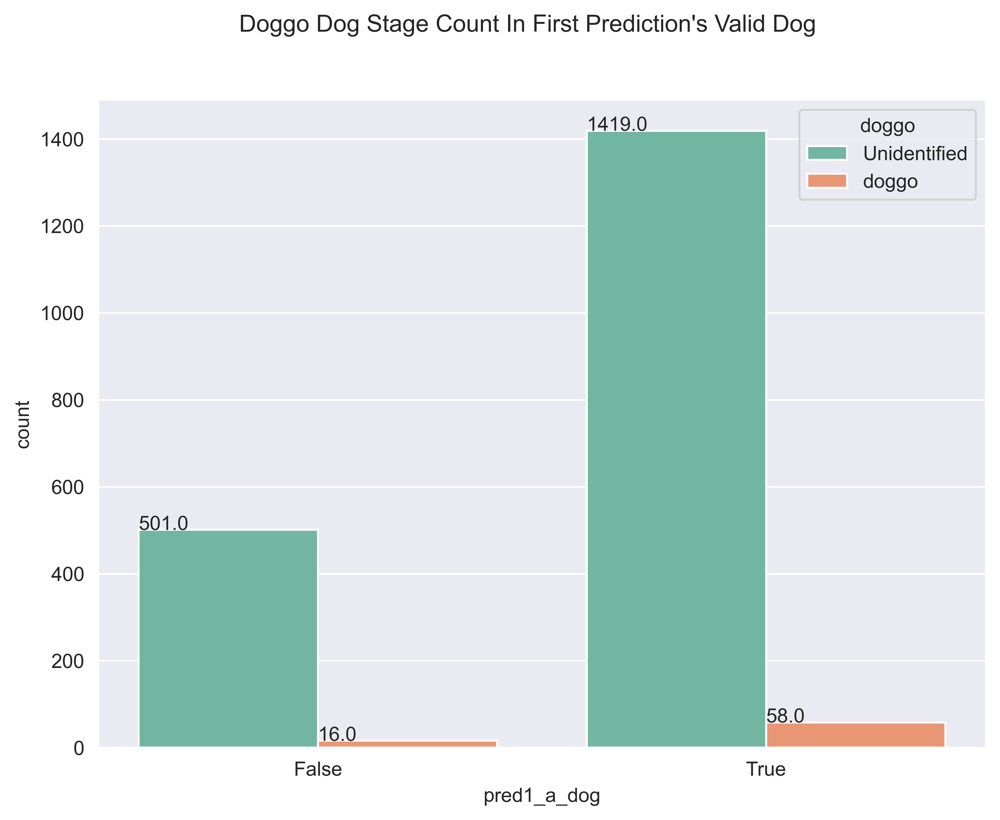

In [138]:
# calling func to plot pred1 
# valid dog & dog stage
bivariate_count_plot('pred1_a_dog', 'doggo', "Doggo Dog Stage Count In First Prediction's Valid Dog" )

**From the figure above of the first predictions; the total of 1,477 were valid dog predictions, amongst them were 58 dogs in the doggo dog stage**

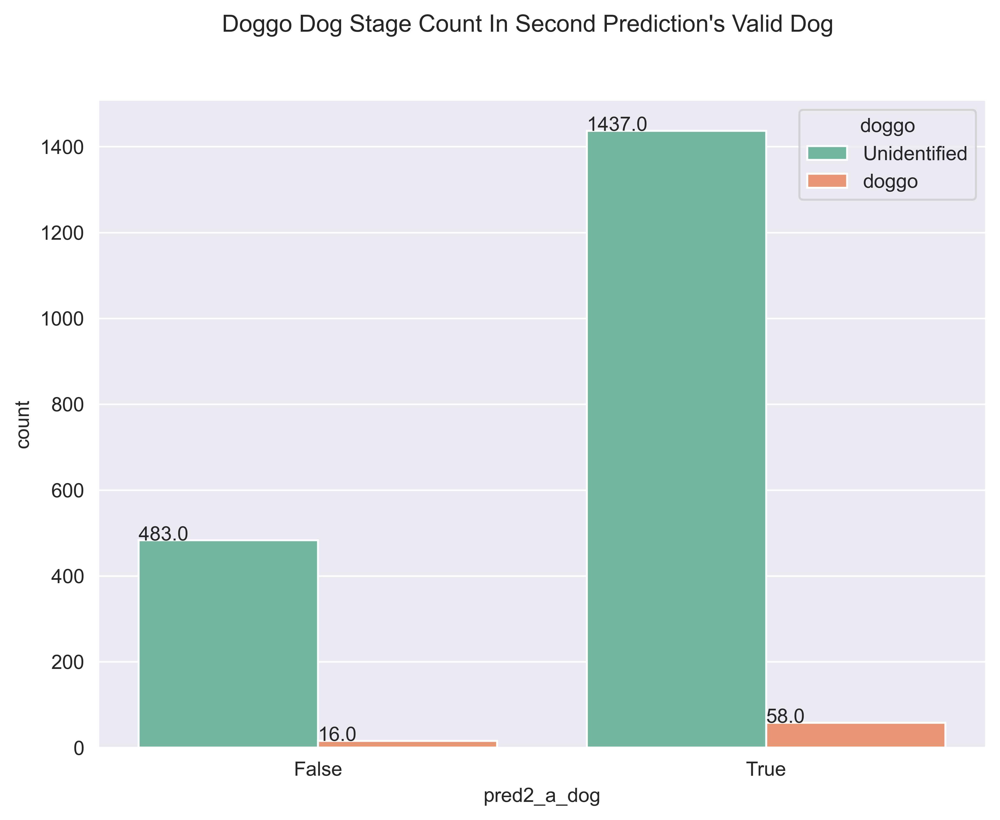

In [139]:
# calling func to plot pred2 
# valid dog & dog stage
bivariate_count_plot('pred2_a_dog', 'doggo', "Doggo Dog Stage Count In Second Prediction's Valid Dog")

**From the figure above of the second predictions; the total of 1,495 were valid dog predictions, amongst them were 58 dogs in the doggo dog stage**

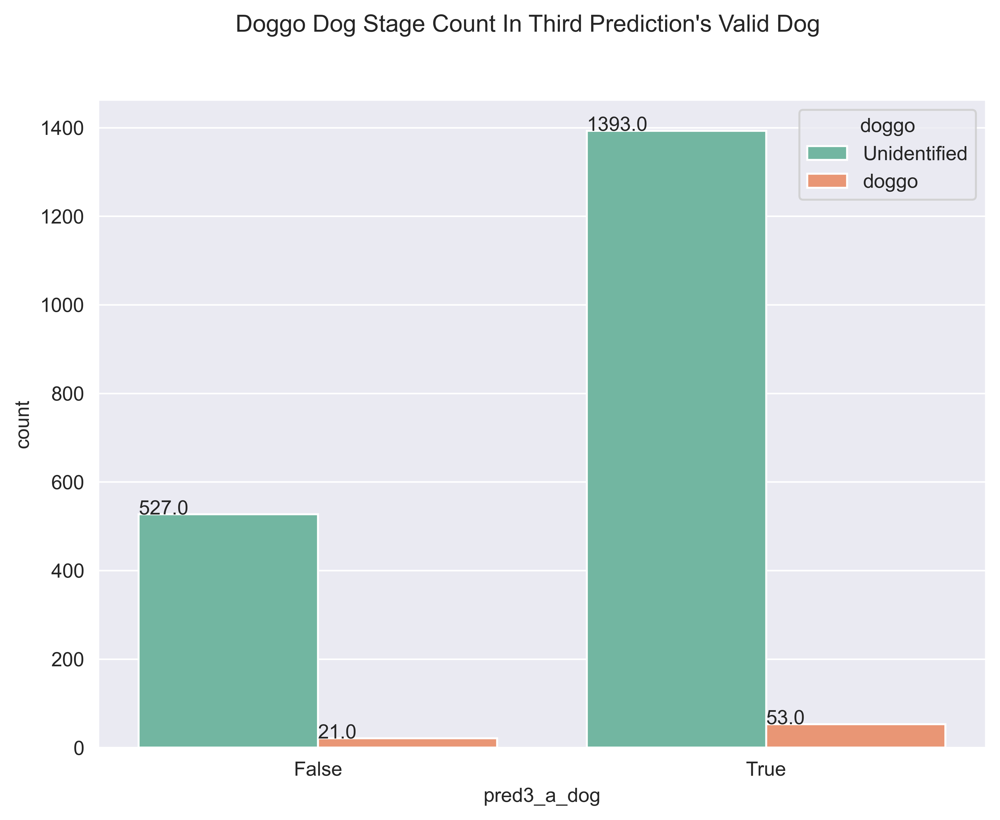

In [140]:
# calling func to plot pred3 
# valid dog & dog stage
bivariate_count_plot('pred3_a_dog', 'doggo', "Doggo Dog Stage Count In Third Prediction's Valid Dog")

**From the figure above of the third predictions; the total of 1,446 were valid dog predictions, amongst them were 53 dogs in the doggo dog stage**

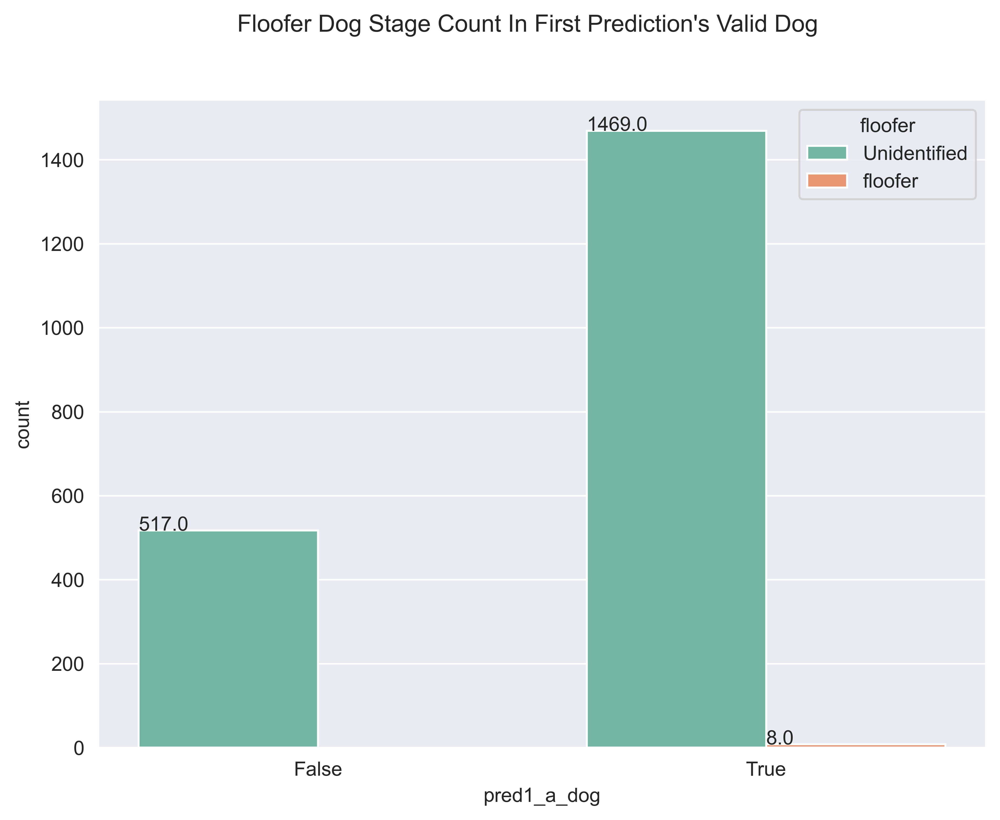

In [141]:
# calling func to plot pred1 
# valid dog & dog stage
bivariate_count_plot('pred1_a_dog', 'floofer', "Floofer Dog Stage Count In First Prediction's Valid Dog")

**From the figure above of the first predictions; the total of 1,477 were valid dog predictions, amongst them were 8 dogs in the floofer dog stage**

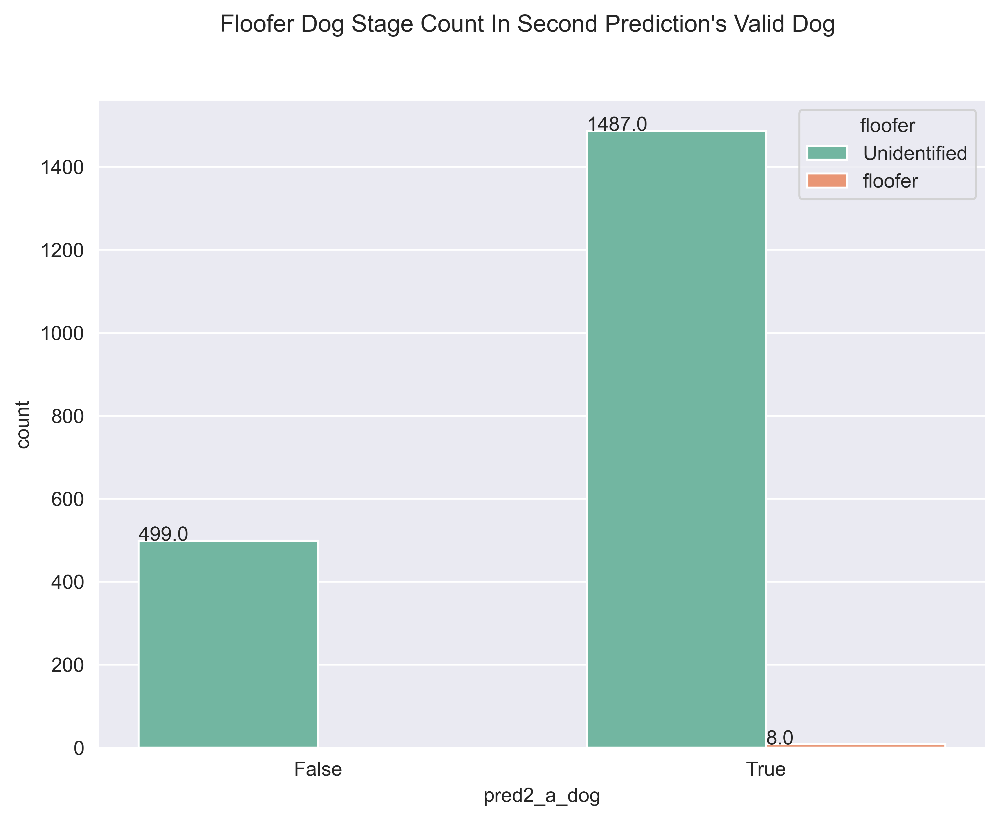

In [142]:
# calling func to plot pred2 
# valid dog & dog stage
bivariate_count_plot('pred2_a_dog', 'floofer', "Floofer Dog Stage Count In Second Prediction's Valid Dog")

**From the figure above of the second predictions; the total of 1,495 were valid dog predictions, amongst them were 8 dogs in the floofer dog stage**

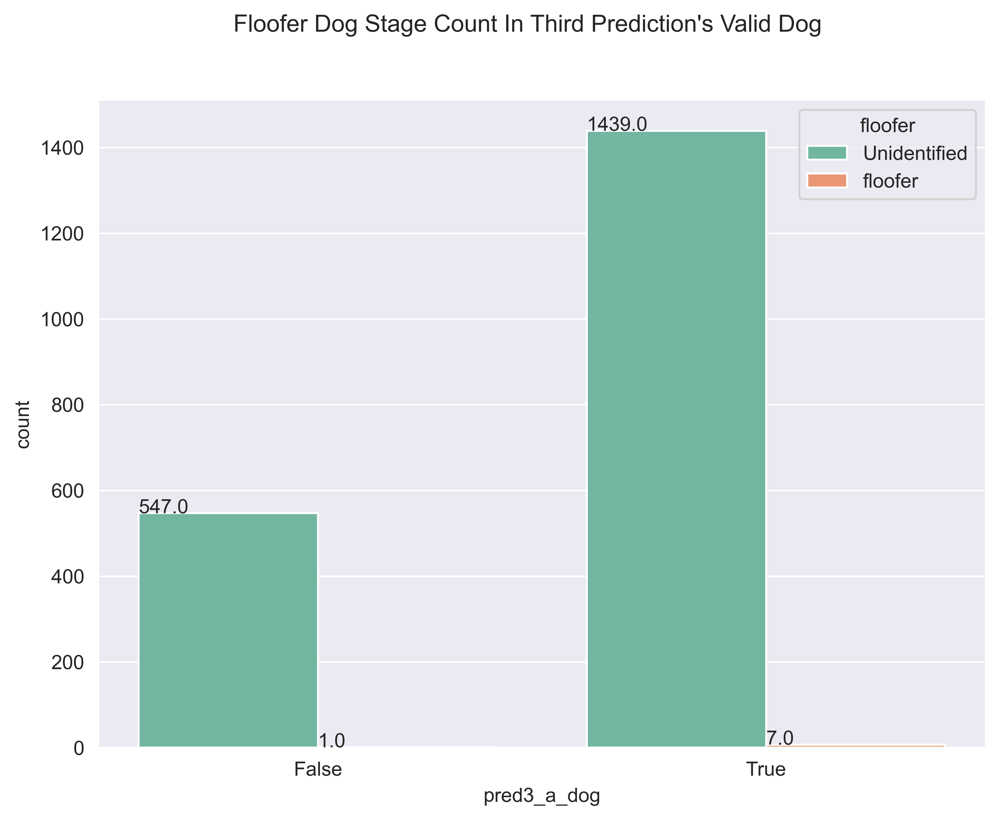

In [143]:
# calling func to plot pred3 
# valid dog & dog stage
bivariate_count_plot('pred3_a_dog', 'floofer', "Floofer Dog Stage Count In Third Prediction's Valid Dog")

**From the figure above of the third predictions; the total of 1,446 were valid dog predictions, amongst them were 7 dogs in the floofer dog stage**

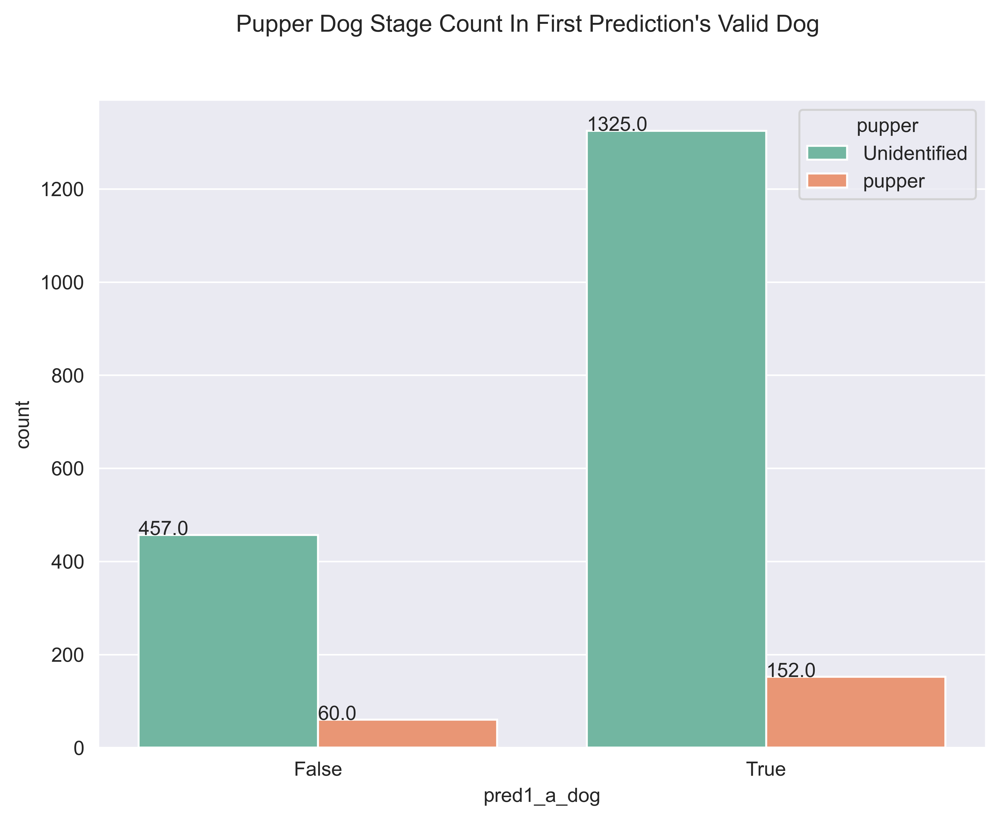

In [144]:
# calling func to plot pred1 
# valid dog & dog stage
bivariate_count_plot('pred1_a_dog', 'pupper', "Pupper Dog Stage Count In First Prediction's Valid Dog")

**From the figure above of the first predictions; the total of 1,477 were valid dog predictions, amongst them were 152 dogs in the pupper dog stage**

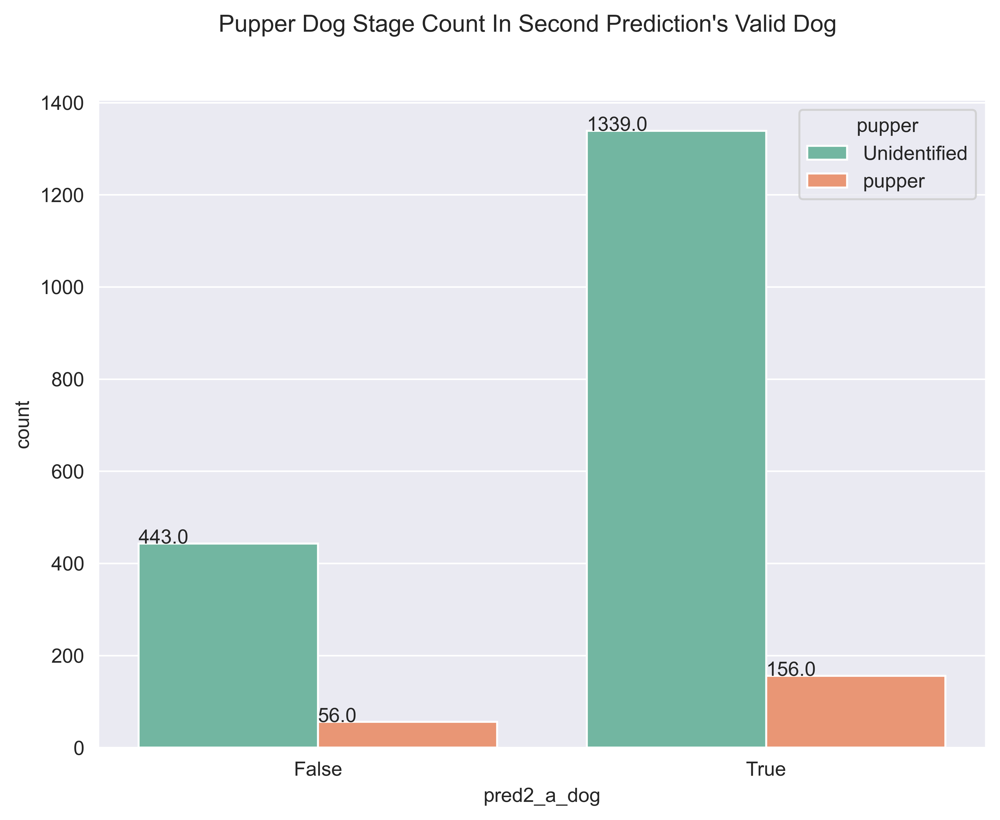

In [145]:
# calling func to plot pred2 
# valid dog & dog stage
bivariate_count_plot('pred2_a_dog', 'pupper', "Pupper Dog Stage Count In Second Prediction's Valid Dog")

**From the figure above of the second predictions; the total of 1,495 were valid dog predictions, amongst them were 156 dogs in the pupper dog stage**

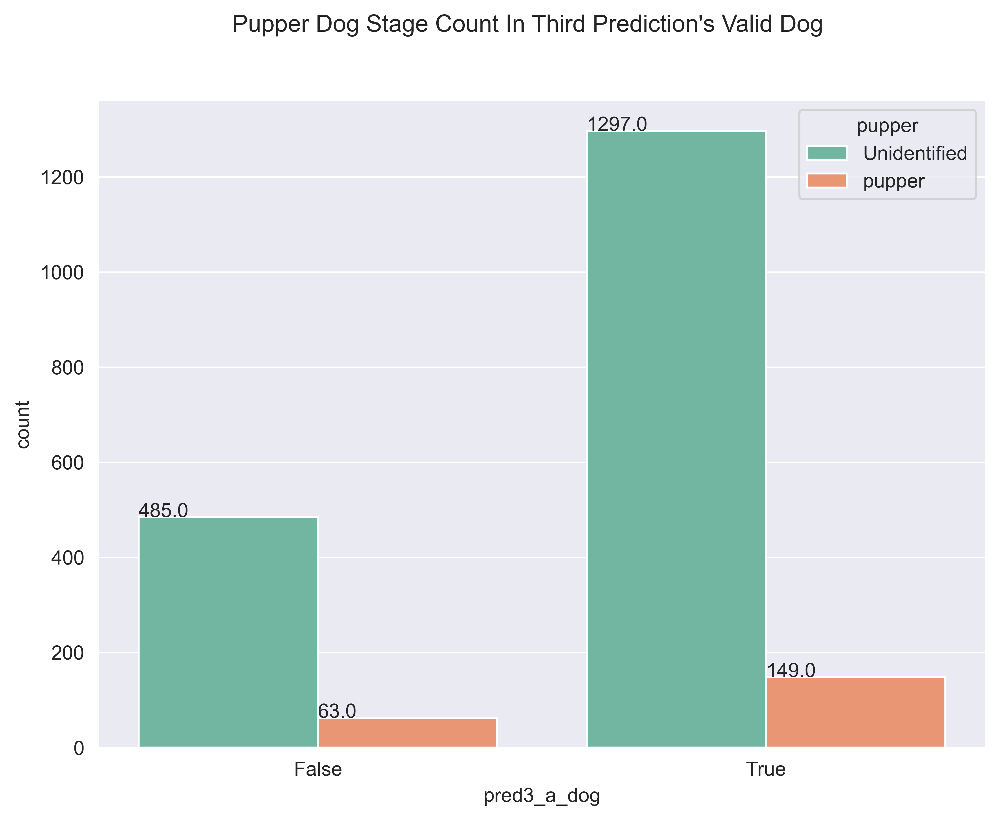

In [146]:
# calling func to plot pred3 
# valid dog & dog stage
bivariate_count_plot('pred3_a_dog', 'pupper', "Pupper Dog Stage Count In Third Prediction's Valid Dog")

**From the figure above of the third predictions; the total of 1,446 were valid dog predictions, amongst them were 149 dogs in the pupper dog stage**

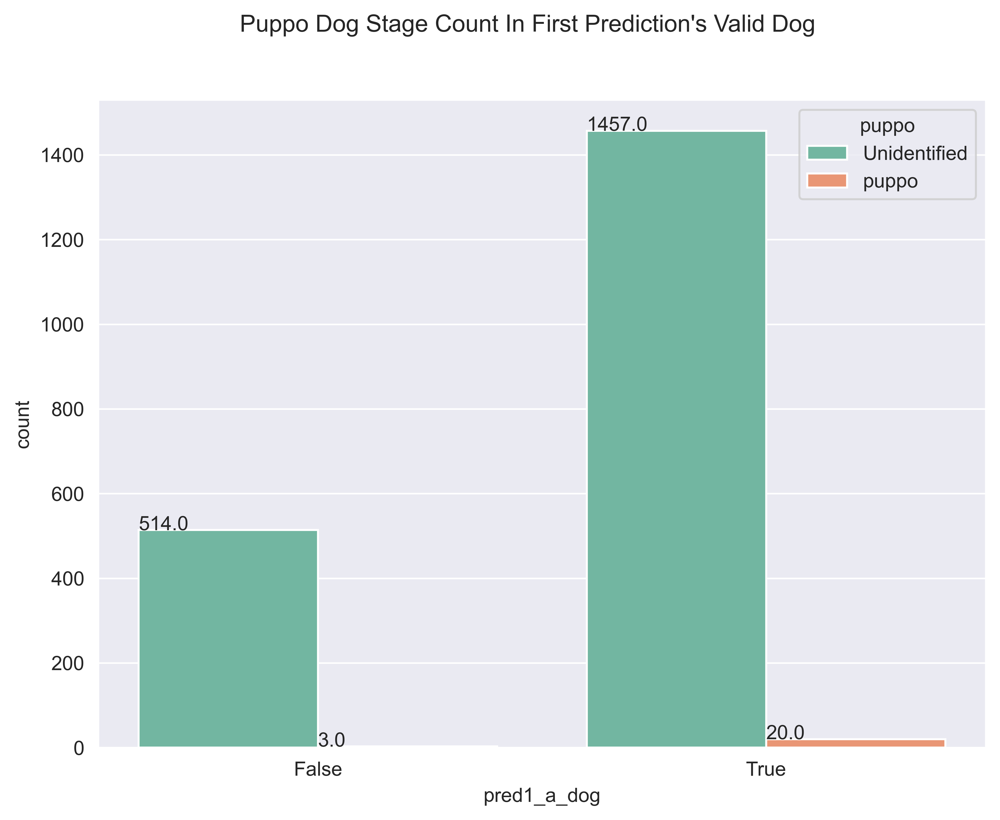

In [147]:
# calling func to plot pred1 
# valid dog & dog stage
bivariate_count_plot('pred1_a_dog', 'puppo', "Puppo Dog Stage Count In First Prediction's Valid Dog")

**From the figure above of the first predictions; the total of 1,477 were valid dog predictions, amongst them were 20 dogs in the puppo dog stage**

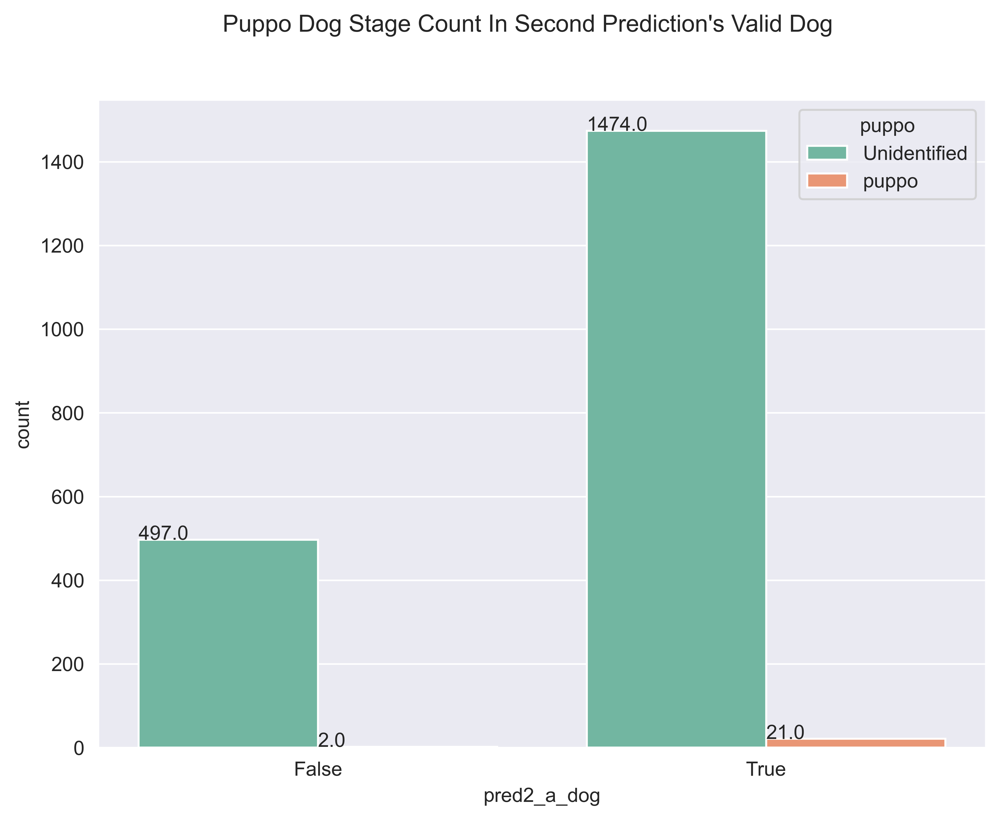

In [148]:
# calling func to plot pred2 
# valid dog & dog stage
bivariate_count_plot('pred2_a_dog', 'puppo', "Puppo Dog Stage Count In Second Prediction's Valid Dog")

**From the figure above of the second predictions; the total of 1,495 were valid dog predictions, amongst them were 21 dogs in the puppo dog stage**

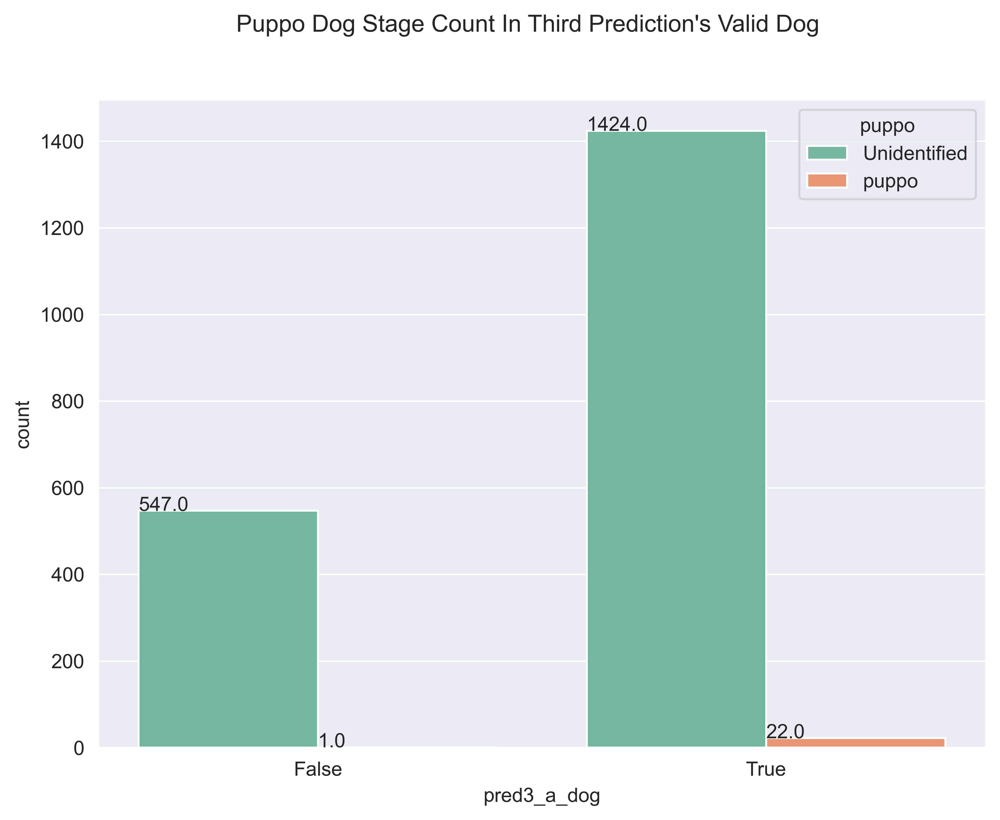

In [149]:
# calling func to plot pred3 
# valid dog & dog stage
bivariate_count_plot('pred3_a_dog', 'puppo', "Puppo Dog Stage Count In Third Prediction's Valid Dog")

**From the figure above of the third predictions; the total of 1,446 were valid dog predictions, amongst them were 22 dogs in the puppo dog stage**

- To check the distribution of each dog stage, a function is defined below to access each dog's stage in the gathered tweets. 

In [150]:
# func to plot a countplot
def univariate_count_plot(x, title):
    """plot a countplot of one variable"""
    """param:x, title"""
    """return none"""
    fig = plt.figure(figsize=(8,6), dpi= 400)
    ax =sns.countplot(x = x , data =twitter_archive_master)
    for p in ax.patches:
      ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0, p.get_height()+0.05))
    title = fig.suptitle(title)
    plt.plot()   
plt.show();

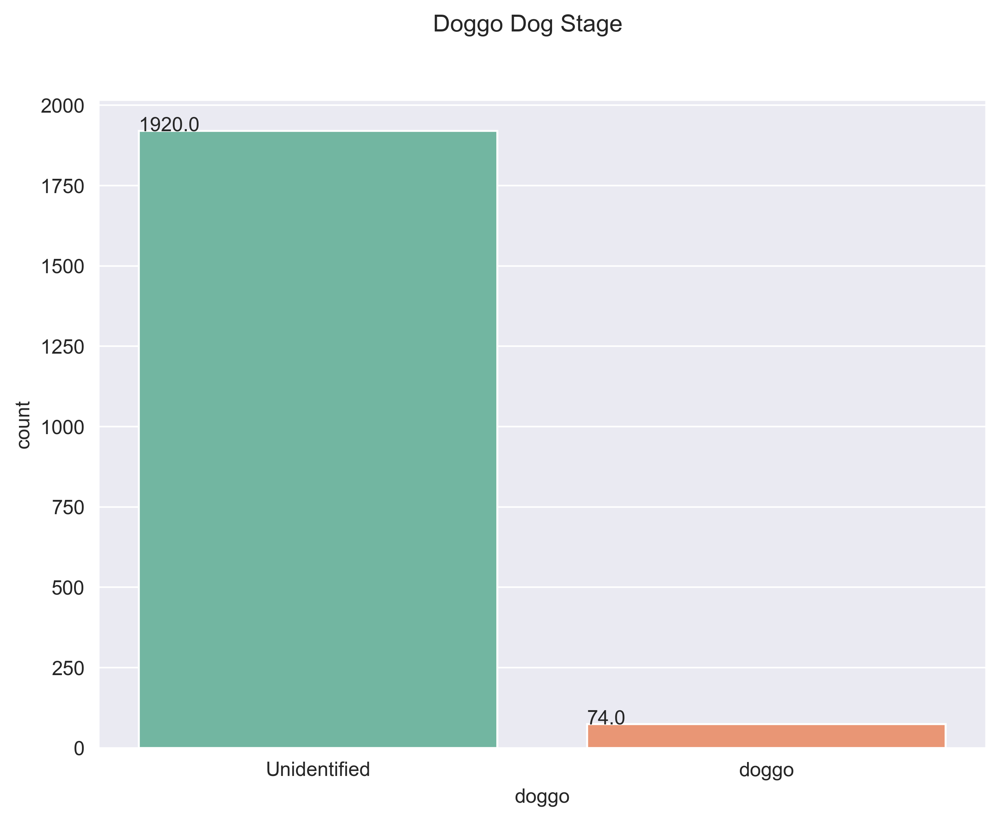

In [151]:
# call func to plot doggo stage
univariate_count_plot('doggo', 'Doggo Dog Stage')

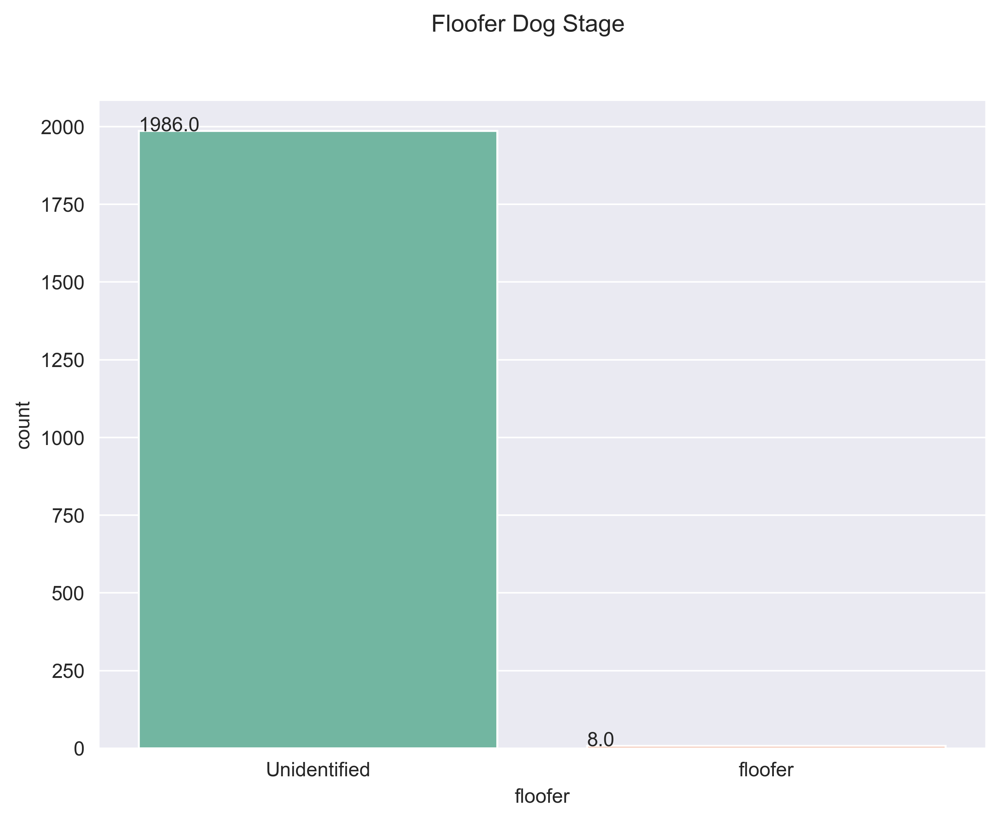

In [152]:
# call func to plot floofer stage
univariate_count_plot('floofer', 'Floofer Dog Stage')

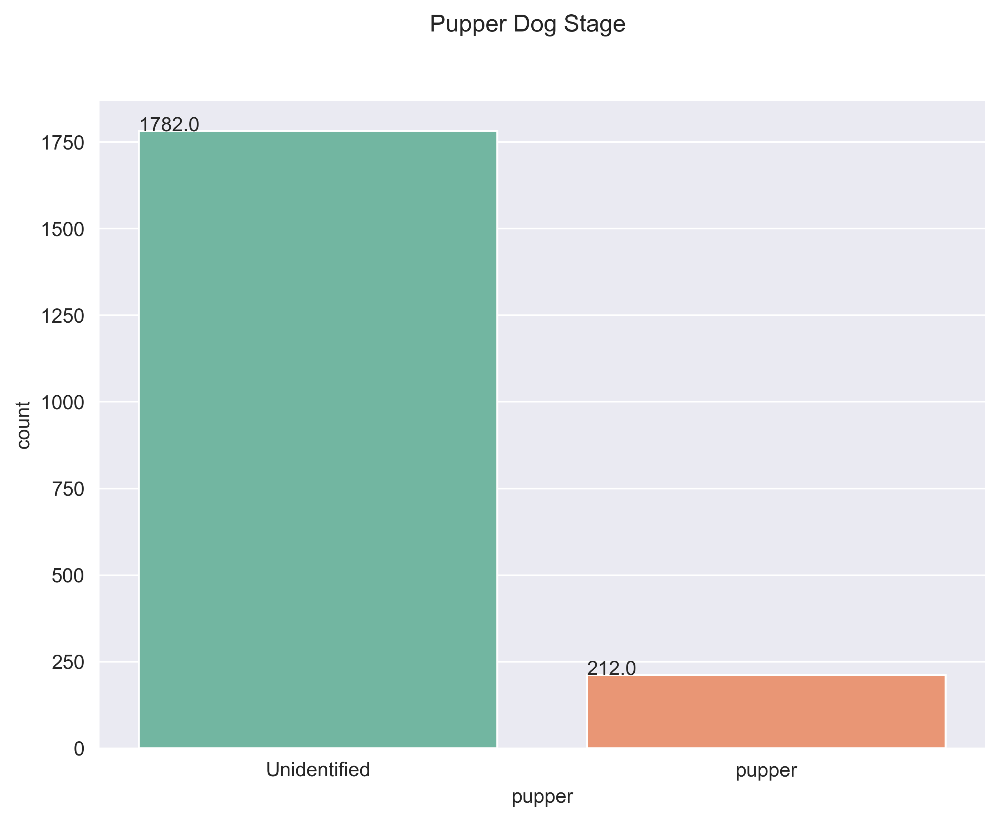

In [153]:
# call func to plot pupper stage
univariate_count_plot('pupper', 'Pupper Dog Stage')

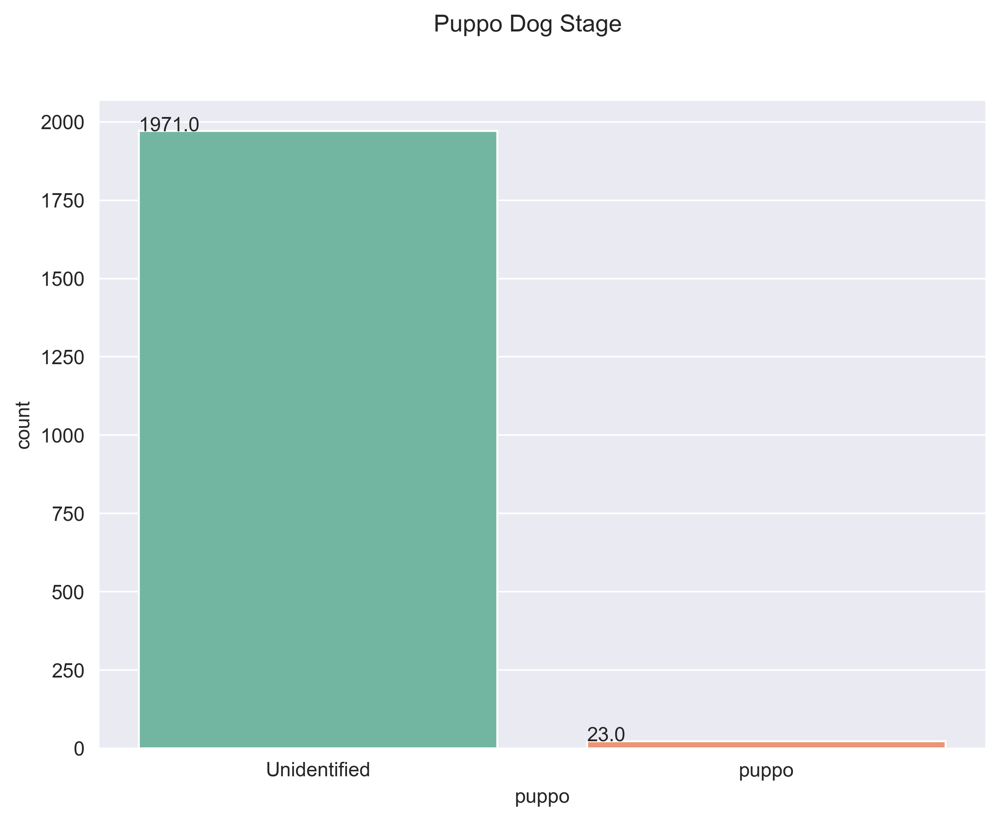

In [154]:
# call func to plot puppo stage
univariate_count_plot('puppo', 'Puppo Dog Stage')

**In the Dog stage category, tweets that contain floofer dog stage has the lowest occurence which stands at 8, followed by puppo with occurence of 23,  pupper dog stage rank the highest in the dog stages  which stands at 212 followed by doggo ranked second with occurence of 74.**

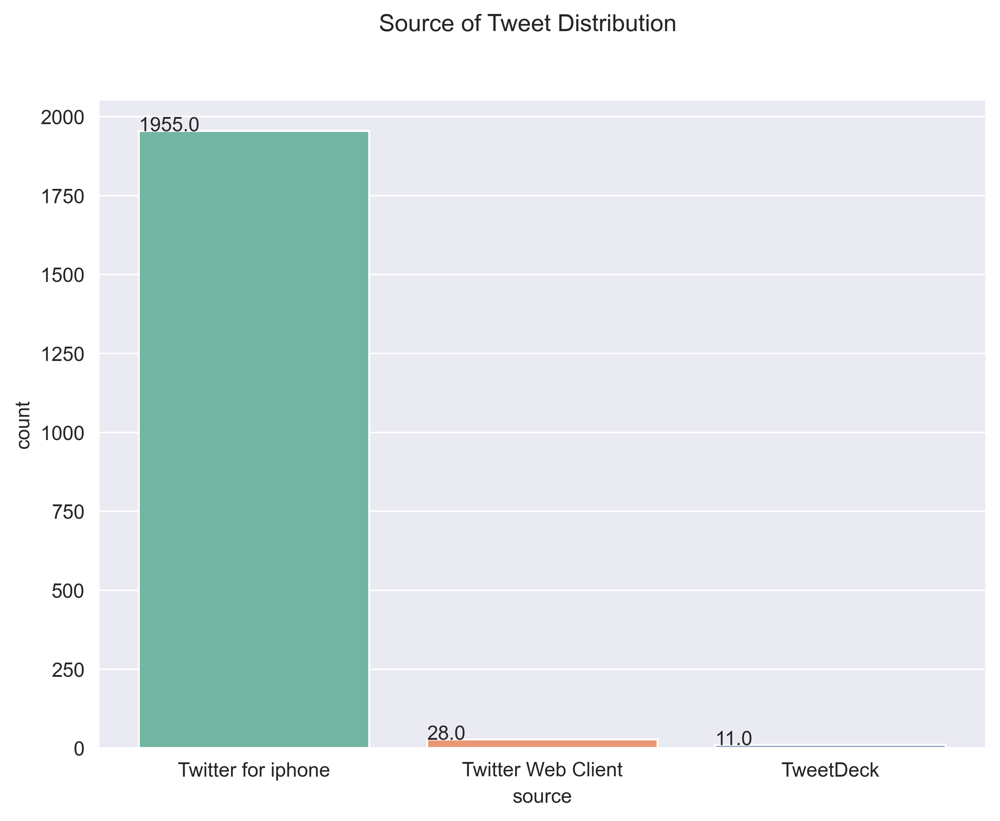

In [155]:
# call func to plot
# freq of source of tweet
univariate_count_plot('source', 'Source of Tweet Distribution')

**The figure above indicates that majority of the tweets are sent from Twitter for iphone with an occurence of 1955, representing 98% of the category of source of tweet.**

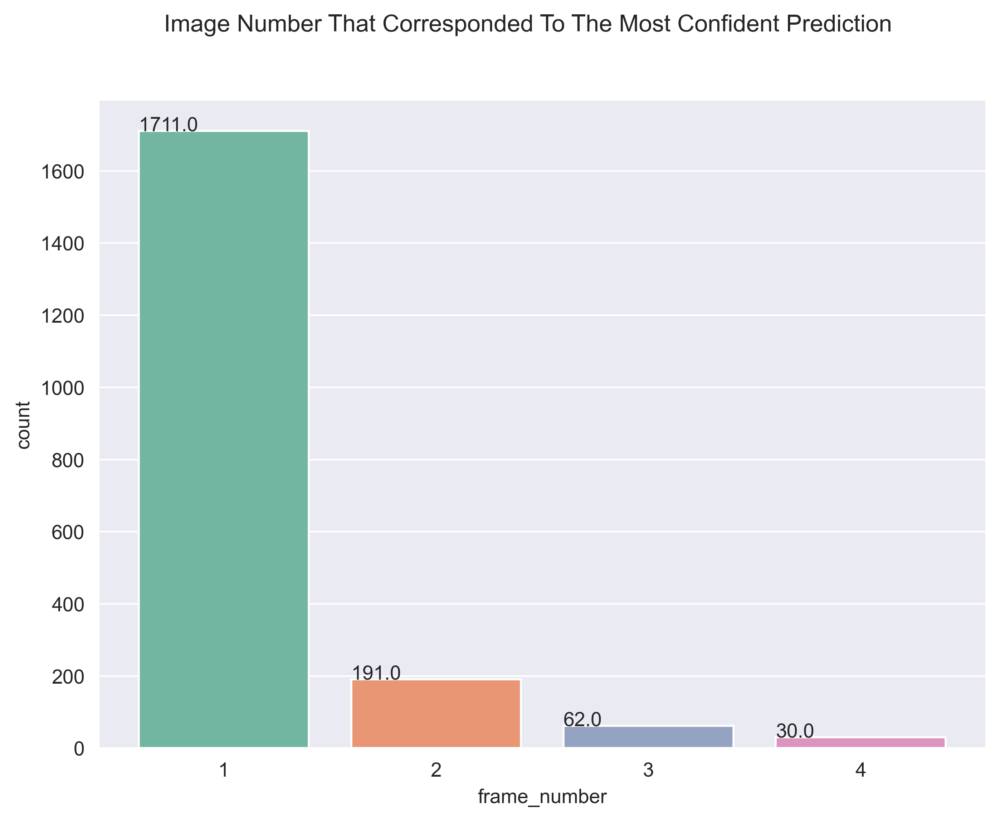

In [156]:
# call func to plot freq of number
# of the pred image
univariate_count_plot('frame_number', 'Image Number That Corresponded To The Most Confident Prediction')

**From the above figure, since tweets can have up to four images, images that occcupy the first frame in the tweets corresponds the most to the most confident prediction .**

- To figure out the tweet that contain a valid prediction of dog, a function to plot a barplot that will show the distribution of tweet that contain a valid dog prediction.

In [157]:
# define a func to plot bar plot of retweet count
# in each category of dog prediction validity
def draw_bar_plot(by, title, groupby):
    """plot a barplot"""
    """param: by, groupby, title"""
    """return ax, count"""
    ax = twitter_archive_master.groupby(by = by)['retweet_count'].count().plot(kind = 'bar', ylabel = 'Tweet Count', xlabel = 'Prediction a Dog', figsize=(10,8), title = title)
    plt.xticks(rotation="360")
    count = twitter_archive_master.groupby(groupby).count()['retweet_count']
    return ax, count 



(<AxesSubplot:title={'center':'Retweet Count of Each Category of First Dog Prediction Validity'}, xlabel='Prediction a Dog', ylabel='Tweet Count'>,
 pred1_a_dog
 False     517
 True     1477
 Name: retweet_count, dtype: int64)

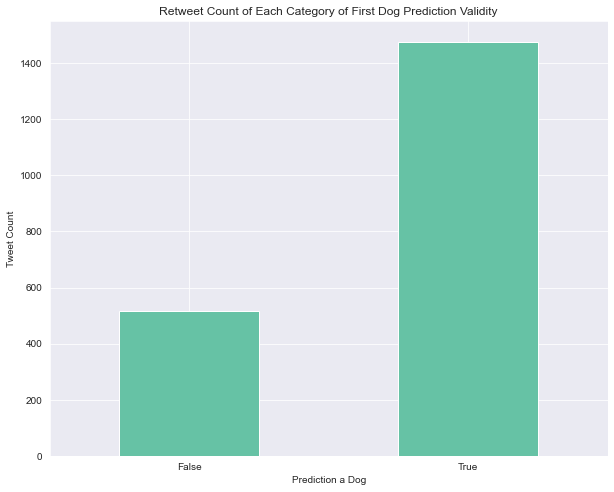

In [158]:
# call the function to access retweet count in 
# each category of first dog prediction validity
draw_bar_plot(twitter_archive_master.pred1_a_dog, 'Retweet Count of Each Category of First Dog Prediction Validity', twitter_archive_master.pred1_a_dog )

**The figure above indicates that from all the tweets, 1477 contain a valid prediction of Dog in the first prediction.**

(<AxesSubplot:title={'center':'Retweet Count of Each Category of Second Dog Prediction Validity'}, xlabel='Prediction a Dog', ylabel='Tweet Count'>,
 pred2_a_dog
 False     499
 True     1495
 Name: retweet_count, dtype: int64)

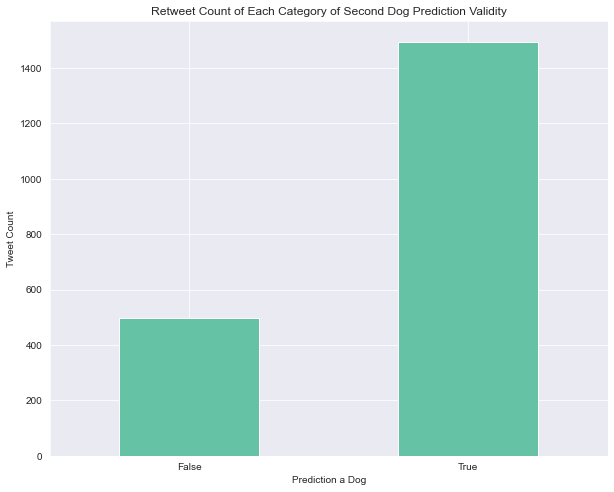

In [159]:
# retweet count in each category 
# of second dog prediction validity
draw_bar_plot('pred2_a_dog', 'Retweet Count of Each Category of Second Dog Prediction Validity', 'pred2_a_dog' )

**The figure above indicates that from all the tweets, 1495 contain a valid prediction of Dog in the second prediction.**

(<AxesSubplot:title={'center':'Retweet Count of Each Category of Third Dog Prediction Validity'}, xlabel='Prediction a Dog', ylabel='Tweet Count'>,
 pred3_a_dog
 False     548
 True     1446
 Name: retweet_count, dtype: int64)

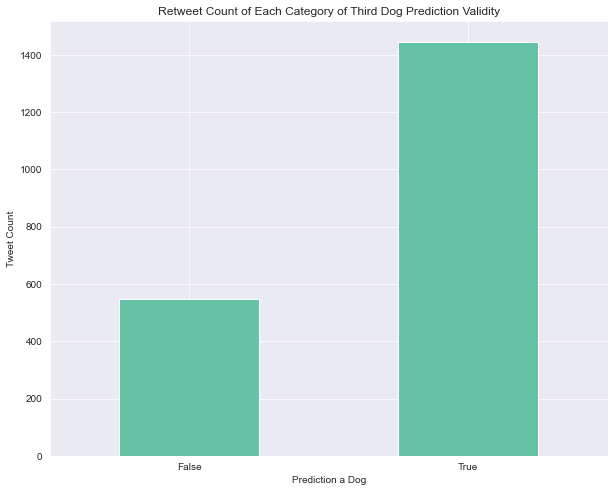

In [160]:
# retweet count in each category 
# of third dog prediction validity
draw_bar_plot('pred3_a_dog', 'Retweet Count of Each Category of Third Dog Prediction Validity', 'pred3_a_dog' )

**The figure above indicates that from all the tweets, 1446 contain a valid prediction of Dog in the third prediction.**

- The mean confidence of each predictions categorized into dog stages can be figure out with the function defined below.

In [161]:
# func to plot the mean confidence  of  
#  on a barplot of all predictions
def draw_multivariate_bar_plot(by, title, groupby):
    """plot a barplot"""
    """param: by, groupby, title"""
    """return ax, mean"""
    ax = twitter_archive_master.groupby(by = by).mean()[['pred1_conf%', 'pred2_conf%', 'pred3_conf%']].plot(kind = 'bar', ylabel = 'Mean Confidence', xlabel ='Dog Stage', figsize=(10,8), title = title)
    plt.xticks(rotation="360")
    mean = twitter_archive_master.groupby(groupby).mean()[['pred1_conf%', 'pred2_conf%', 'pred3_conf%']]
    return ax, mean 
    

(<AxesSubplot:title={'center':'Mean Confidence of Doggo Dog'}, xlabel='Dog Stage', ylabel='Mean Confidence'>,
               pred1_conf%  pred2_conf%  pred3_conf%
 doggo                                              
 Unidentified     0.593638     0.133896     0.060284
 doggo            0.601791     0.147989     0.059325)

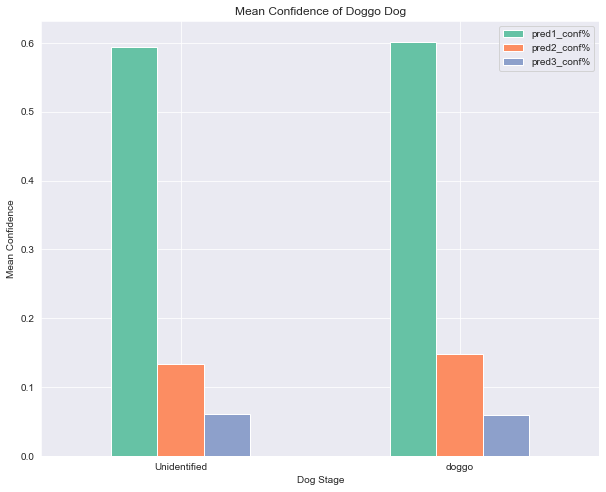

In [162]:
# calling the func to plot
# doggo mean confidence of predictions
draw_multivariate_bar_plot(twitter_archive_master.doggo, 'Mean Confidence of Doggo Dog', twitter_archive_master.doggo )

**For the prediction with a doggo dog stage the mean confidence in first prediction is the highest, with a value 0f 60%, i.e. 60% confidence in the accuracy of the prediction. The Third prediction has the lowest confidence in the accuracy of prediction with about 6%.** 

(<AxesSubplot:title={'center':'Mean Confidence of Floofer Dog'}, xlabel='Dog Stage', ylabel='Mean Confidence'>,
               pred1_conf%  pred2_conf%  pred3_conf%
 floofer                                            
 Unidentified     0.594008     0.134324     0.060256
 floofer          0.577395     0.158096     0.058460)

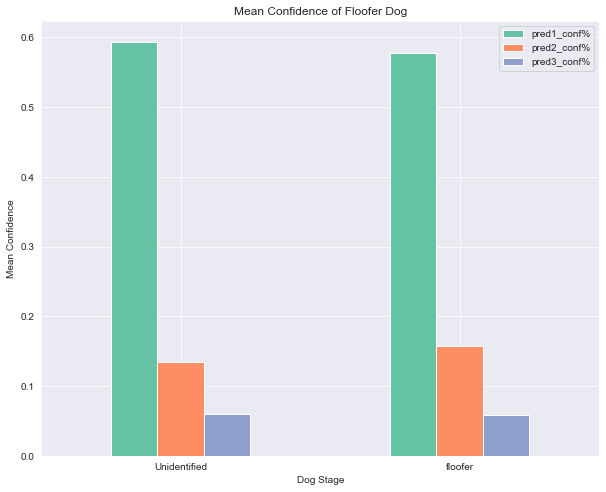

In [163]:
# floofer mean confidence of predictions
draw_multivariate_bar_plot('floofer', 'Mean Confidence of Floofer Dog', 'floofer')

**For the prediction with a floofer dog stage the mean confidence in first prediction is the highest, with a value 0f 58%, i.e. 58% confidence in the accuracy of the prediction. The Third prediction has the lowest confidence in the accuracy of prediction with about 6%.** 

(<AxesSubplot:title={'center':'Mean Confidence of Pupper Dog'}, xlabel='Dog Stage', ylabel='Mean Confidence'>,
               pred1_conf%  pred2_conf%  pred3_conf%
 pupper                                             
 Unidentified     0.591506     0.135118     0.060815
 pupper           0.614405     0.128549     0.055486)

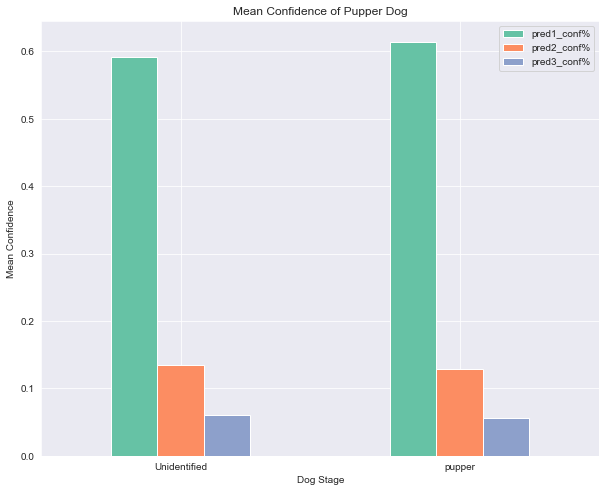

In [164]:
# pupper mean confidence of predictions
draw_multivariate_bar_plot('pupper', 'Mean Confidence of Pupper Dog', 'pupper')

**For the prediction with a pupper dog stage the mean confidence in first prediction is the highest, with a value 0f 61%, i.e. 61% confidence in the accuracy of the prediction. The Third prediction has the lowest confidence in the accuracy of prediction with about 6%.** 

(<AxesSubplot:title={'center':'Mean Confidence of Puppo Dog'}, xlabel='Dog Stage', ylabel='Mean Confidence'>,
               pred1_conf%  pred2_conf%  pred3_conf%
 puppo                                              
 Unidentified     0.592646     0.134418     0.060415
 puppo            0.704875     0.134584     0.045979)

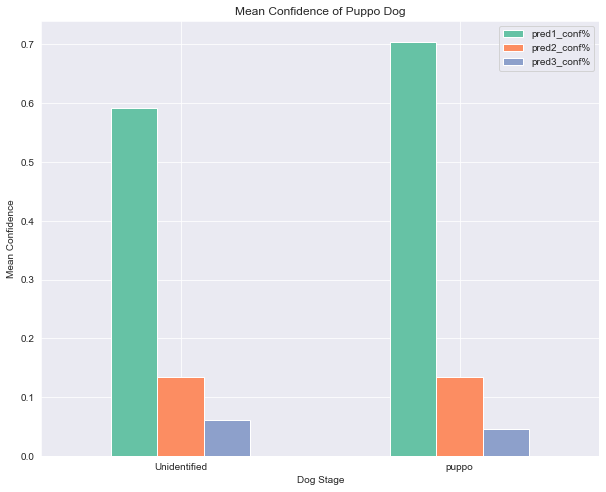

In [165]:
# floofer mean confidence of predictions
draw_multivariate_bar_plot('puppo', 'Mean Confidence of Puppo Dog', 'puppo')

**For the prediction with a puppo dog stage the mean confidence in first prediction is the highest, with a value 0f 70%, i.e. 70% confidence in the accuracy of the prediction. The third prediction has the lowest confidence in the accuracy of prediction with about 5%.** 

- A line graph indicating the correlation between the retweet count and favorite count. 

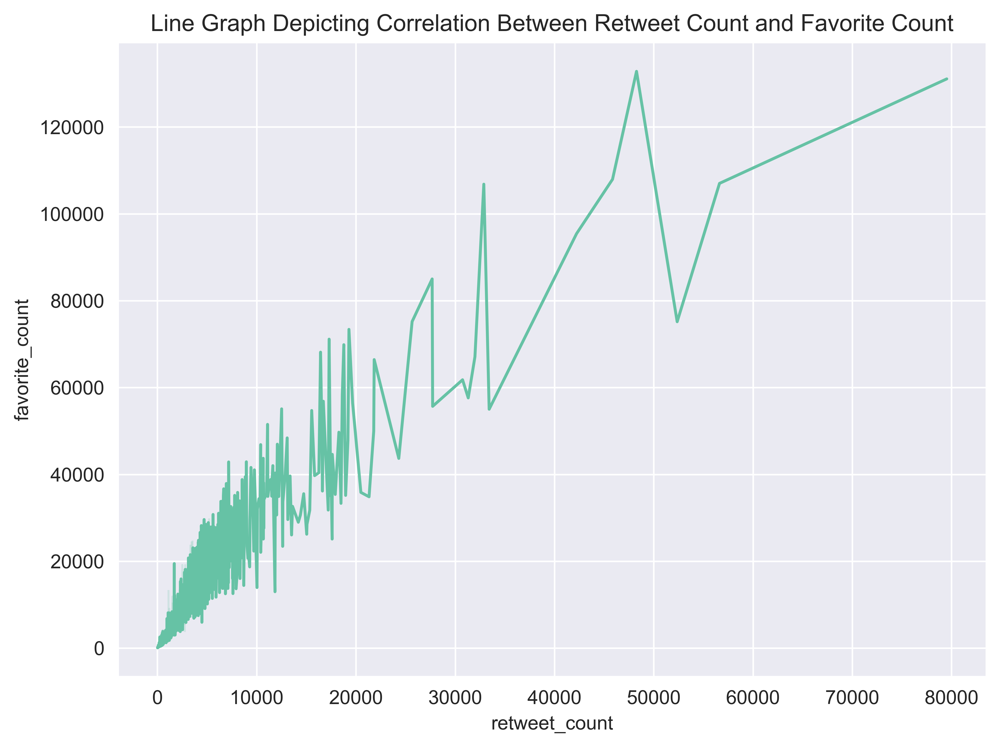

In [166]:
# plot a line graph
fig, ax = plt.subplots(figsize =(8,6), dpi =600)
p = sns.lineplot(x= 'retweet_count', y = 'favorite_count', data =  twitter_archive_master)
p.set(title = 'Line Graph Depicting Correlation Between Retweet Count and Favorite Count')
plt.savefig("linegraph.png", format="png")


**The figure above highlight the correlation between the retweet count and favorite count, in this case a positive correction, it make sense as the more a tweet get retweeted the tendency to reach more audience for potential likes.**

- The data point of the retweet count and favorite count categorized by prediction validity plotted on a scatter point to show the relationship between the three variables, the function below plot a scatterplot where the both retweet count (x-axis) and favorite count(y-axis) are set to a log scale to bettter show the relationship between the multiple variable.  

In [167]:
# func to plot a scatter plot
def draw_scatter_plot(hue):
    """plot a scatter plot"""
    """param: hue"""
    """return none"""
    ax = plt.figure(figsize =(8,6), dpi =600)
    p =sns.scatterplot(x= 'retweet_count', y = 'favorite_count', data =  twitter_archive_master, hue = hue)
    p.set(title ='Retweet and Favorite Tweet Correlation Categorized By Prediction Validity')
    p.set(xscale = 'log')
    p.set(yscale = 'log')
    plt.savefig("scatterplot.png", format="png")

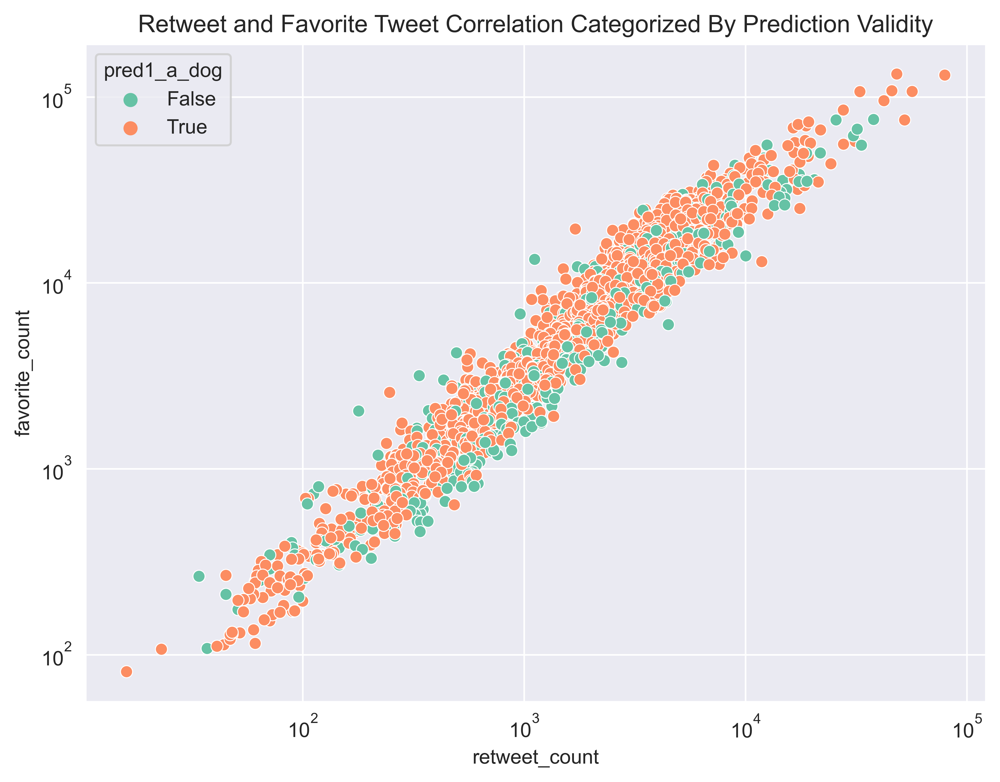

In [168]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of first prediction 
draw_scatter_plot('pred1_a_dog')

**The correlation between the retweet count and favorite count is positive, it's quite logical the more a tweet get retweeted the tendency to reach more audience for potential likes, data points are represented categorically by the validity of the first prediction, the correct prediction as true and wrong prediction as false. In this first predictions scenario we can figure out each data points of whether the prediction was a dog or not.**  

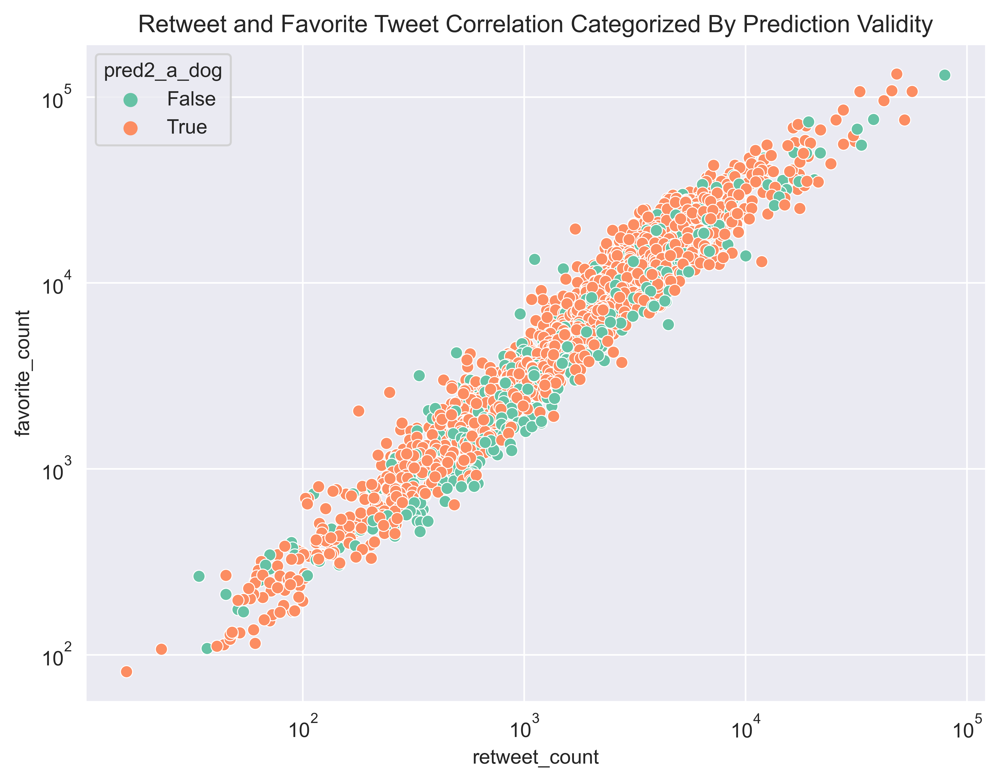

In [169]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of second prediction 
draw_scatter_plot('pred2_a_dog')

**The correlation between the retweet count and favorite count is positive, it's quite logical the more a tweet get retweeted the tendency to reach more audience for potential likes, data points are represented categorically by the validity of the first prediction, the correct prediction as true and wrong prediction as false. In this second predictions scenario we can figure out each data points of whether the prediction was a dog or not.**   

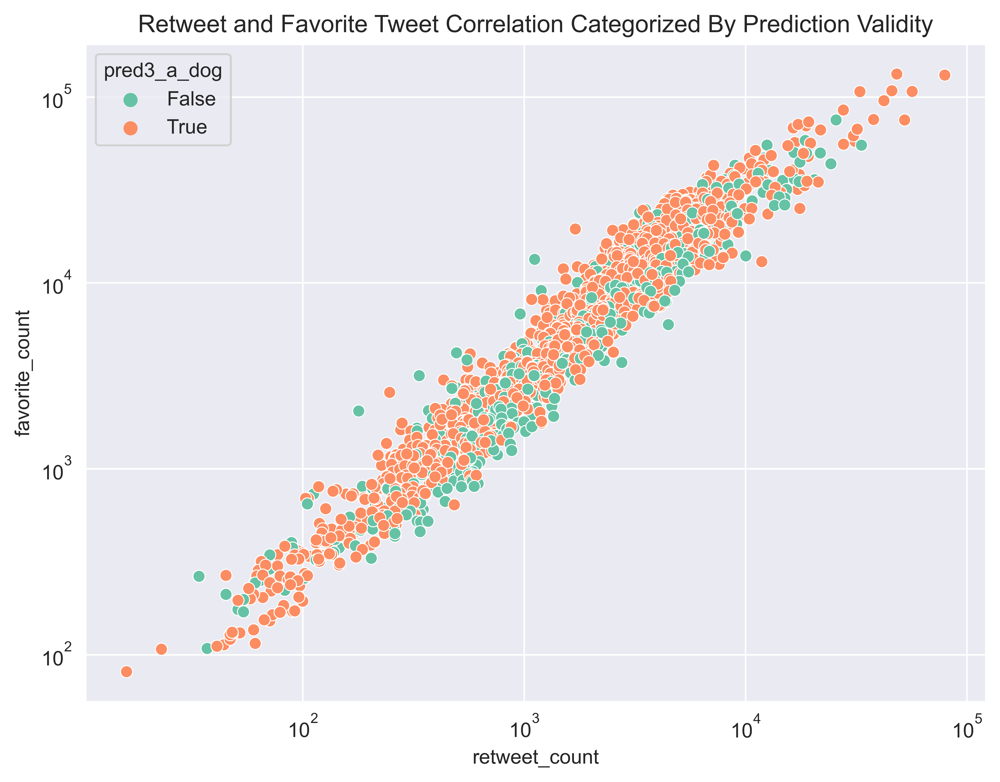

In [170]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of third prediction 
draw_scatter_plot('pred3_a_dog')

**The correlation between the retweet count and favorite count is positive, it's quite logical the more a tweet get retweeted the tendency to reach more audience for potential likes, data points are represented categorically by the validity of the first prediction, the correct prediction as true and wrong prediction as false. In this third predictions scenario we can figure out each data points of whether the prediction was a dog or not.** 

>***In the image prediction dataframe there are predictions that were not dogs in all the three predictions, we can decide to assess the predictions that were dog only. it would be logical to filter out the image prediction that predicted something else other than a dog, consequently a word cloud would be appropriate to display the predicted dog breed in word cloud.***

In [171]:
# filter out wrong prediction for first second & third predictions
valid_dog_pred = twitter_archive_master[(twitter_archive_master.pred1_a_dog== True) & (twitter_archive_master.pred2_a_dog== True)& (twitter_archive_master.pred3_a_dog)]

In [172]:
# check the pred1 for wrong prediction
valid_dog_pred.query('pred1_a_dog == False')

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,favorite_count,retweet_count


In [173]:
# check the pred2 for wrong prediction
valid_dog_pred.query('pred2_a_dog == False')

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,favorite_count,retweet_count


In [174]:
# check the pred3 for wrong prediction
valid_dog_pred.query('pred3_a_dog == False')

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,favorite_count,retweet_count


In [175]:
# install wordcloud
! pip install wordcloud

In [176]:
# import wordcloud
from wordcloud import WordCloud

In [177]:
# each item in pred1, pred2 & pred3 column as text to be generated
text_pred1 = " ".join(i for i in valid_dog_pred['pred1'])
text_pred2 = " ".join(i for i in valid_dog_pred['pred2'])
text_pred3 = " ".join(i for i in valid_dog_pred['pred3'])

In [178]:
# each pred wordcould title
title_pred1 = 'Word Cloud For First Prediction'
title_pred2 = 'Word Cloud For Second Prediction'
title_pred3 = 'Word Cloud For Third Prediction'

In [179]:
# plot a func to plot wordcloud for preditions
def draw_word_cloud(text, title):
    """Plot a word cloud of Dog Predictions"""
    """param: text, title"""
    """return none"""
    wordcloud = WordCloud(background_color="white", max_font_size=300, width=1024, height=1000, colormap="magma").generate_from_text(text)
    plt.figure(figsize=(20,20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.margins(x=0, y=0)
    plt.suptitle(title, fontsize=30)
    plt.savefig("wordcloud.png", format="png")
    plt.show()

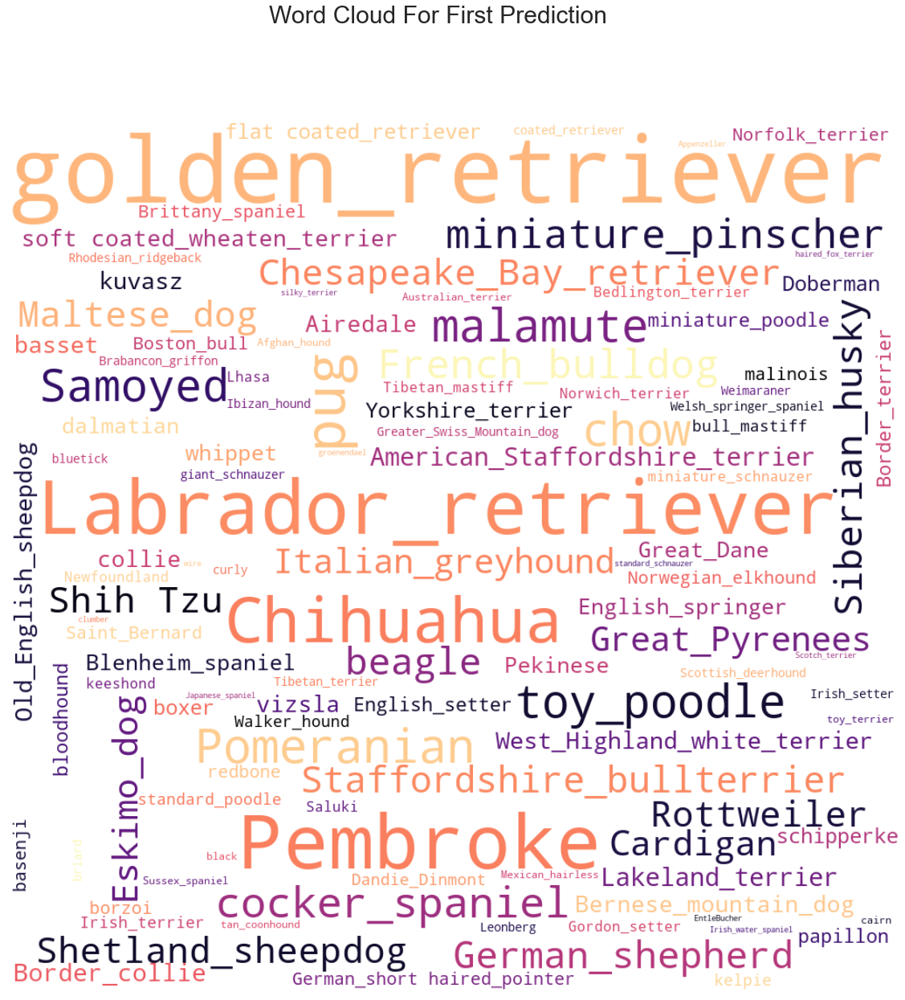

In [180]:
# call func to plot wordcloud
# for  first prediction 
draw_word_cloud(text_pred1, title_pred1)

**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**

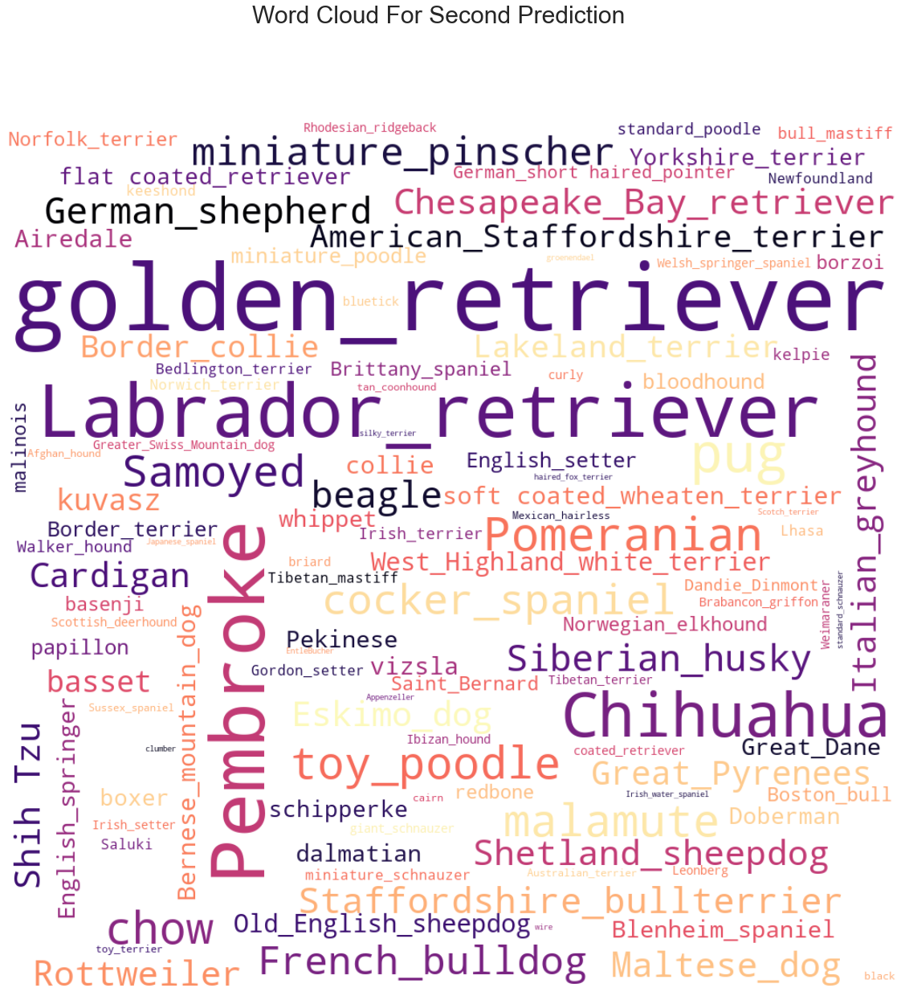

In [181]:
# call func to plot wordcloud
# for first prediction 
draw_word_cloud(text_pred2, title_pred2)

**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**

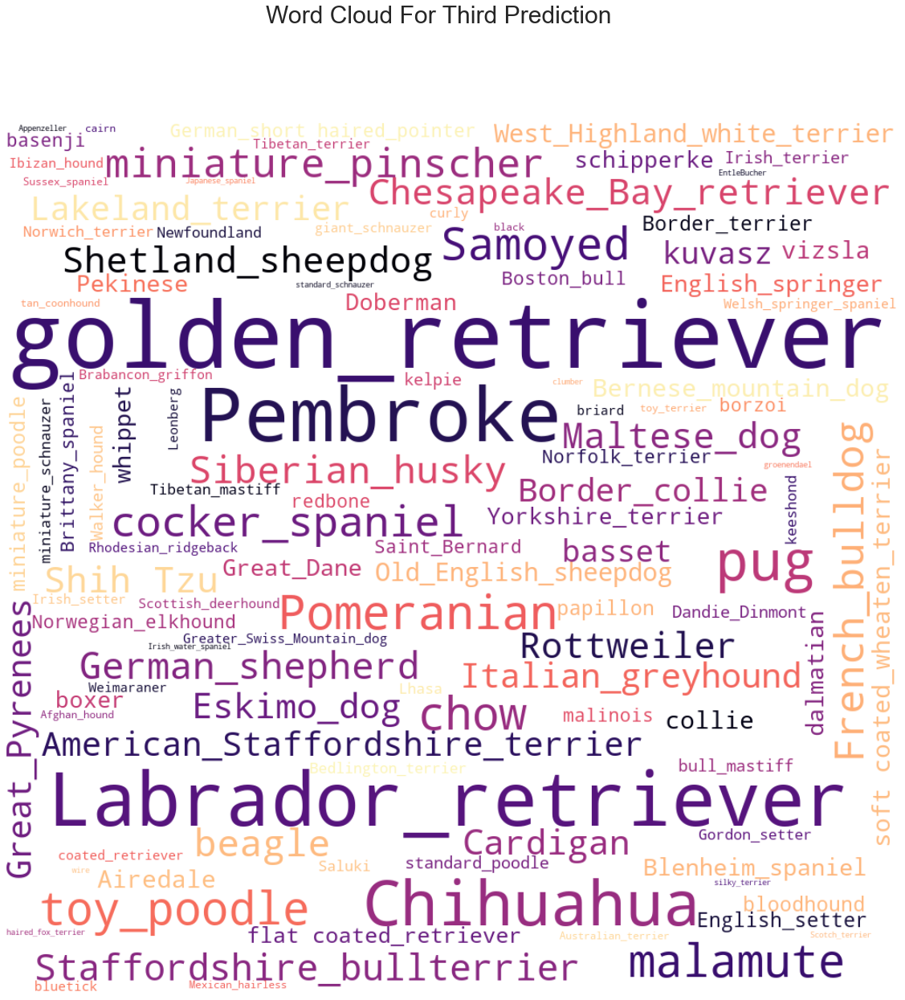

In [182]:
# call func to plot wordcloud
# for first prediction 
draw_word_cloud(text_pred3, title_pred3)

**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**

- Predicted images are presented in url from the image prediction dataframe, to have a better understanding of the prediction, it was decided to pass a random url as a request and writing the response file on the local machine, the written file would be displayed with matplotlib image.  

In [183]:
# check the img pred url
valid_dog_pred.jpg_url

1       https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg
2       https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg
4       https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg
7       https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg
8       https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg
                             ...                       
1989    https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg
1990    https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg
1991    https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg
1992    https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg
1993    https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg
Name: jpg_url, Length: 1203, dtype: object

In [184]:
# create variable name for url in index 9
image_pred9 = valid_dog_pred.jpg_url[9]

In [185]:
# import img from matplotlib
from matplotlib import image as img

In [186]:
# func to disply img from a url
def draw_img_frm_url(url):
    """requires internet access"""
    """write image from url to 
    local machine as img_pred file"""    
    """use matplotlib to plot the
    image file"""    
    """param: url"""
    """return none"""
    image_file = open('img_pred','wb')
    image_file.write(requests.get(url).content)
    image_file.close()
    plt.figure(figsize=(16,16))
    plt.title('Image Prediction', fontsize = 15)  
    image = img.imread('img_pred')
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    plt.savefig("dog_sample.png", format="png")
    plt.show()

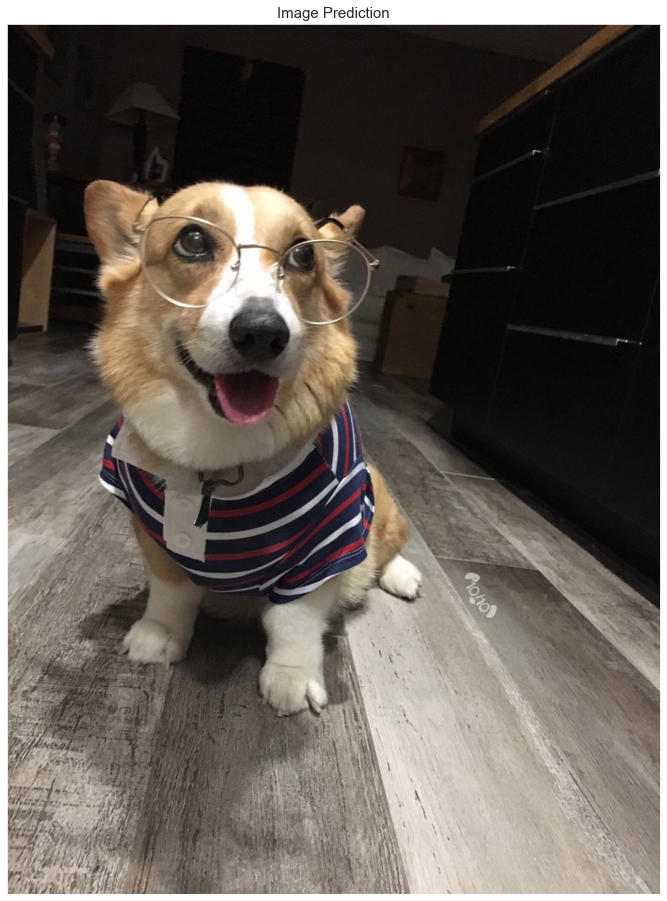

In [187]:
# calling func to plot predicted
# image in index 9
draw_img_frm_url(image_pred9)

In [188]:
# Display content of tweet
# dog predicted
valid_dog_pred.tweet[9]

'This is Cassie. She is a college pup. Studying international doggo communication and stick theory. '

In [189]:
# check out url for index 1993
valid_dog_pred.jpg_url[1993]

'https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg'

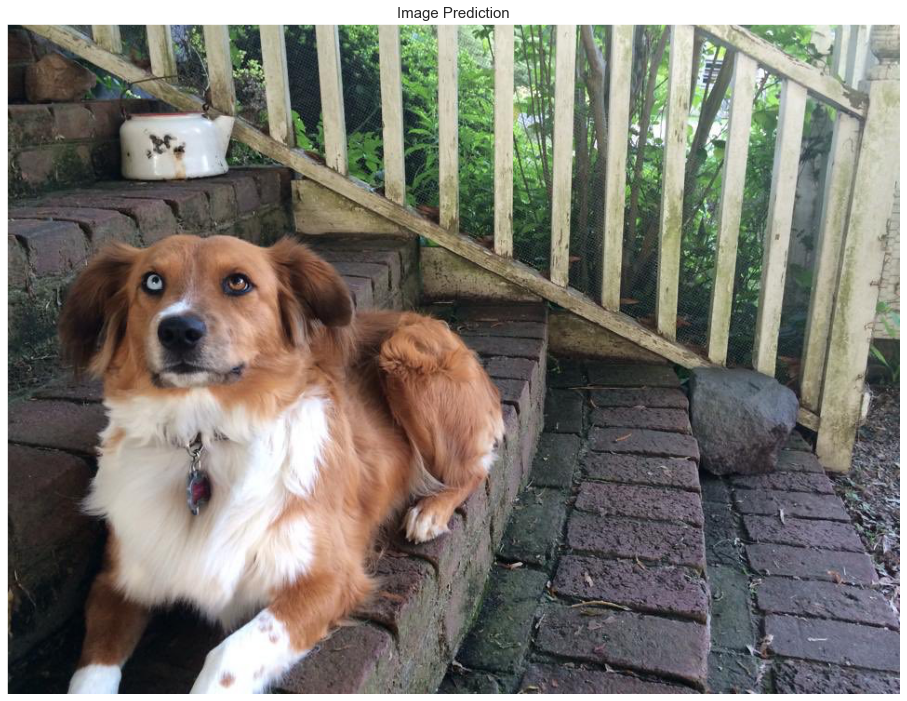

In [190]:
# calling func to plot predicted
# image in index 1993
draw_img_frm_url(valid_dog_pred.jpg_url[1993])

In [191]:
# Display content of tweet
# dog predicted
valid_dog_pred.tweet[1993]

'Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. '

**The image predictions were spot on as a result of the sample gotten above, we can confirm this with the tweet that was archived in the twitter archive dataframe. For prediction in index number 9 we have the tweet as "This is Cassie. She is a college pup. Studying international doggo communication and stick theory for dog", and for prediction in index number 1993 we have the tweet as  "Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair"** 

>**To display the image predictions instead of the url we are going to make use of IPython.display package to display image in html, we can decide to assess the predictions that were dog only. it would be logical display predicted images that are dog and not something else, the filtered valid dog dataframe will be assessed in this scenario.**  

In [192]:
# import the package to display image
from IPython.display import Image, HTML

In [193]:
# function to convert img path to img html
def path_to_image_html(path):
    """convert url to img"""
    """param: path"""
    """return <img src="'+ path + '"/>"""
    return '<img src="'+ path + '" style=max-height:124px;"/>'

In [194]:
# display image of valid dog prediction
HTML(valid_dog_pred.to_html(escape=False ,formatters=dict(jpg_url=path_to_image_html)))

,tweet_id,timestamp,source,name,doggo,floofer,pupper,puppo,tweet_link,ratings,tweet,jpg_url,frame_number,pred1,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,favorite_count,retweet_count
1,892177421306343426,2017-08-01 00:17:27+00:00,Twitter for iphone,Tilly,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/0Xxu71qeIV,13/10,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit.",,1,Chihuahua,0.323581,True,Chihuahua,0.090647,True,Chihuahua,0.068957,True,33819,6514
2,891815181378084864,2017-07-31 00:18:03+00:00,Twitter for iphone,Archie,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/wUnZnhtVJB,12/10,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike.,,1,Chihuahua,0.716012,True,Chihuahua,0.078253,True,Chihuahua,0.031379,True,25461,4328
4,891327558926688256,2017-07-29 16:00:24+00:00,Twitter for iphone,Franklin,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/AtUZn91f7f,12/10,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such.",,2,basset,0.555712,True,basset,0.225770,True,basset,0.175219,True,41048,9774
7,890729181411237888,2017-07-28 00:22:40+00:00,Twitter for iphone,Unknown,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/v0nONBcwxq,13/10,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy.,,2,Pomeranian,0.566142,True,Pomeranian,0.178406,True,Pomeranian,0.076507,True,56848,16716
8,890609185150312448,2017-07-27 16:25:51+00:00,Twitter for iphone,Zoey,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/9TwLuAGH0b,13/10,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet.,,1,Irish_terrier,0.487574,True,Irish_terrier,0.193054,True,Irish_terrier,0.118184,True,28226,4429
9,890240255349198849,2017-07-26 15:59:51+00:00,Twitter for iphone,Cassie,doggo,Unidentified,Unidentified,Unidentified,https://t.co/t1bfwz5S2A,14/10,This is Cassie. She is a college pup. Studying international doggo communication and stick theory.,,1,Pembroke,0.511319,True,Pembroke,0.451038,True,Pembroke,0.029248,True,32467,7711
10,890006608113172480,2017-07-26 00:31:25+00:00,Twitter for iphone,Koda,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/dVPW0B0Mme,13/10,This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic.,,1,Samoyed,0.957979,True,Samoyed,0.013884,True,Samoyed,0.008167,True,31166,7624
12,889665388333682689,2017-07-25 01:55:32+00:00,Twitter for iphone,Unknown,Unidentified,Unidentified,Unidentified,puppo,https://t.co/BxvuXk0UCm,13/10,Here's a puppo that seems to be on the fence about something haha no but seriously someone help her.,,1,Pembroke,0.966327,True,Pembroke,0.027356,True,Pembroke,0.004633,True,38818,8538
13,889638837579907072,2017-07-25 00:10:02+00:00,Twitter for iphone,Ted,Unidentified,Unidentified,Unidentified,Unidentified,https://t.co/f8dEDcrKSR,12/10,This is Ted. He does his best. Sometimes that's not enough. But it's ok.,,1,French_bulldog,0.991650,True,French_bulldog,0.002129,True,French_bulldog,0.001498,True,27672,4735
14,889531135344209921,2017-07-24 17:02:04+00:00,Twitter for iphone,Stuart,Unidentified,Unidentified,Unidentified,puppo,https://t.co/y70o6h3isq,13/10,This is Stuart. He's sporting his favorite fanny pack. Secretly filled with bones only.,,1,golden_retriever,0.953442,True,golden_retriever,0.013834,True,golden_retriever,0.007958,True,15359,2321


### Insights:
1. The relationship between the retweet count and favorite count is a positive correction from all indications, it make sense as the more a tweet get retweeted the tendency to reach more audience for potential likes. 

2. The word clouds in all the numbers of predictions of dogs indicate Labrador retriver, golden retriever, chihuahua and pembroke are among the highest number of predictions with every other predicted dogs represented with their breeds in the word clouds.

3. In the Dog stage category, tweets that contain floofer dog stage has the lowest occurence which stands at 8, followed by puppo with occurence of 23, pupper dog stage rank the highest in the dog stages which stands at 212 followed by doggo ranked second with occurence of 74.

4. The majority of the tweets are sent from Twitter for iphone with an occurence of 1955, representing 98% of the category of source of tweet.

### Visualization

[Text(0.5, 1.0, 'Line Graph Depicting Correlation Between Retweet Count and Favorite Count')]

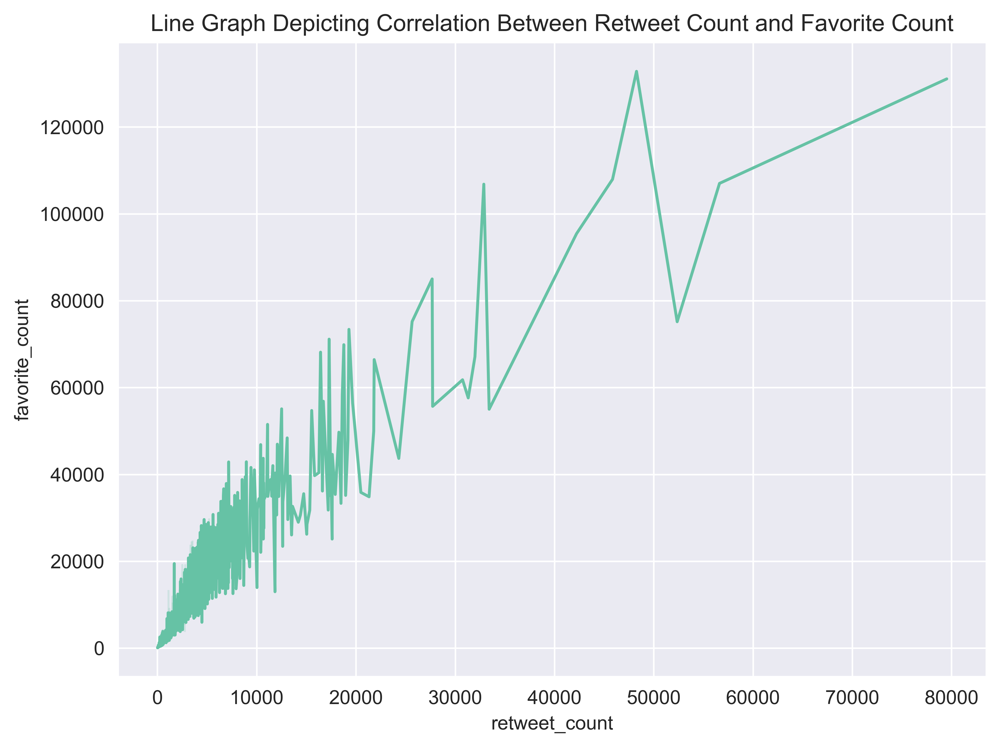

In [195]:
# plot a line graph
fig, ax = plt.subplots(figsize =(8,6), dpi =600)
p = sns.lineplot(x= 'retweet_count', y = 'favorite_count', data =  twitter_archive_master)
p.set(title = 'Line Graph Depicting Correlation Between Retweet Count and Favorite Count')

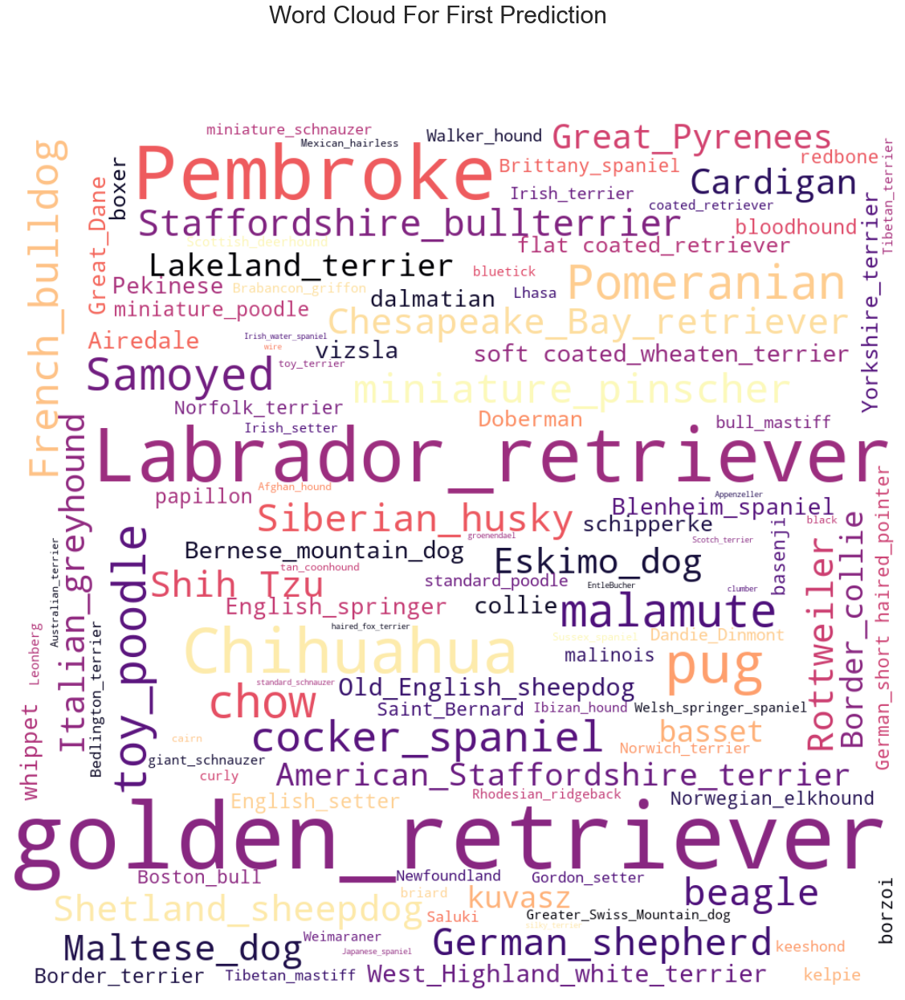

In [196]:
# call func to plot wordcloud
# for first prediction 
draw_word_cloud(text_pred1, title_pred1)

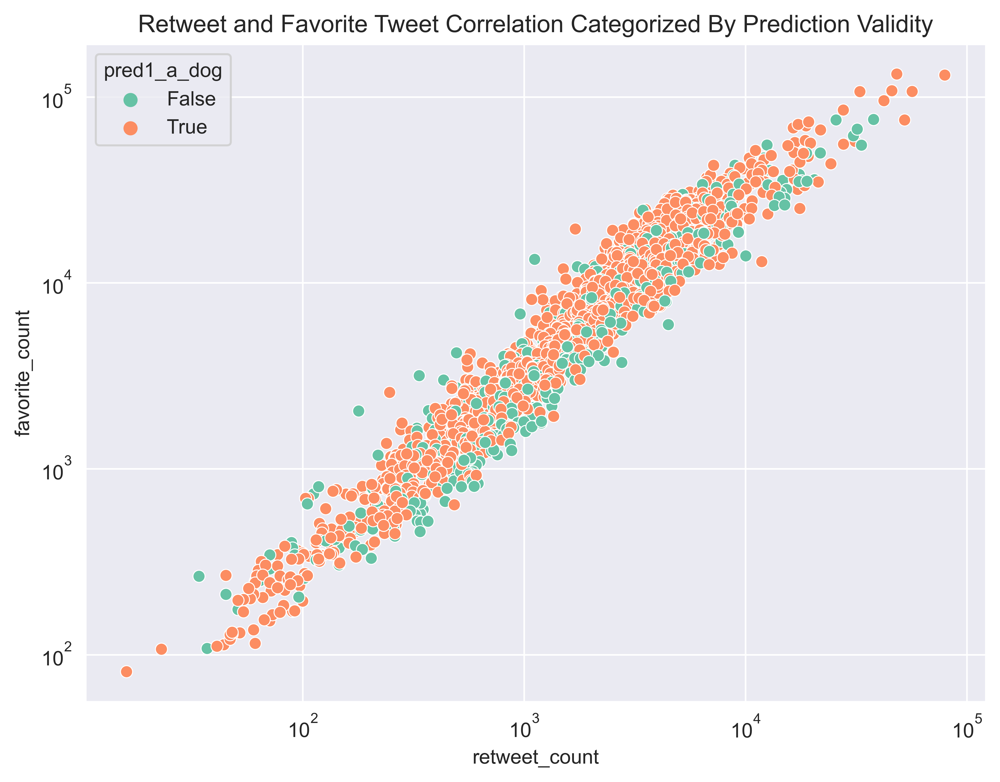

In [197]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of first prediction 
draw_scatter_plot('pred1_a_dog')

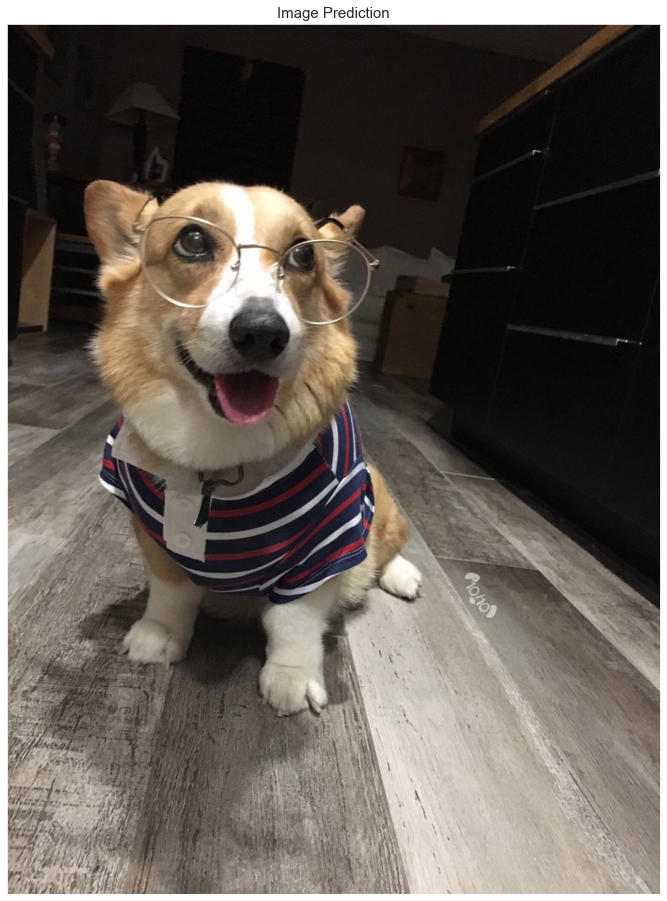

In [200]:
# calling func to plot predicted
# image in index 9
draw_img_frm_url(image_pred9)